<h1><center>Laboratorio 10: Adivina, Adivinador 🔮</center></h1>

<center><strong>MDS7202: Laboratorio de Programación Científica para Ciencia de Datos - Primavera 2025</strong></center>

### Cuerpo Docente:

- Profesores: Diego Cortez, Gabriel Iturra
- Auxiliares: Melanie Peña, Valentina Rojas
- Ayudantes: Nicolás Cabello, Cristopher Urbina

### **Equipo:**

- Nombre de alumno 1: Naomí Cautivo B.
- Nombre de alumno 2: Máximo Flores Valenzuela

### **Link de repositorio de GitHub:** [maxfloresv/MDS7202](https://github.com/maxfloresv/MDS7202)

## Temas a tratar
- Series de Tiempo.
- Predicciones vía `Prophet`.
- Implementar un sistema de recomendación utilizando `surprise`.

## Reglas:

- **Grupos de 2 personas**
- Fecha de entrega: Entregas Miercoles a las 23:59.
- Instrucciones del lab el viernes a las 16:15 en formato online. Asistencia no es obligatoria, pero se recomienda **fuertemente** asistir.
- <u>Prohibidas las copias</u>. Cualquier intento de copia será debidamente penalizado con el reglamento de la escuela.
- Tienen que subir el laboratorio a u-cursos y a su repositorio de github. Labs que no estén en u-cursos no serán revisados. Recuerden que el repositorio también tiene nota.
- Cualquier duda fuera del horario de clases al foro. Mensajes al equipo docente serán respondidos por este medio.
- Pueden usar cualquier material del curso que estimen conveniente.

### Objetivos principales del laboratorio
- Comprender qué es una serie de tiempo y su estructura.
- Identificar tendencias, estacionalidades e irregularidades.
- Armar un modelo predictivo para la serie.
- Conocer y aplicar sistemas de recomendación.
- Entender estructura y conocer casos de estudio.


In [153]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import copy
import plotly.express as px

# **1. Forecasting (30 puntos)**


## **Prophet**

Prophet es una herramienta open-source de Facebook utilizada para realizar predicciones en series de tiempo. Esta se basa en la descomposición aditiva, donde tendencias no lineales se ajustan junto a la estacionalidad.

En la ecuación de a continuación se puede ver una idea general de los elementos que construyen a un modelo aditivo como lo es Prophet.

\begin{equation}
y(t) = g(t) + s(t) + h(t) + e(t)
\end{equation}

Donde, $g(t)$ hace referencia a las tendencias, que corresponden a cambios graduales en largos periodos de tiempo. $s(t)$ corresponde a la estacionalidad, son cambios periodicos o cortos en el tiempo. $h(t)$ es el efecto que tienen las festividades sobre las predicciones, mientras que e(t) corresponde al error o ruido. Finalmente $y(t)$, es la predicción hecha por el modelo.

Prophet trabaja por defecto con Piece-Wise Lineal Model, este es un modelo de regresión lineal, en el cual se buscan distintas zonas en que la data presente patrones o tendencias lineales, de estas zonas obtiene su regresión y luego las "une" de manera de representar toda la región, como se puede ver en la ecuación siguiente.

\begin{equation}
y(x)=
    \begin{cases}
        η_1 + \beta_1(x-b_1), & b_1 < x  \leqslant b_2 \\
        η_2 + \beta_2(x-b_2), & b_2 < x  \leqslant b_3 \\
        η_3 + \beta_3(x-b_3), & b_3 < x  \leqslant b_3 \\
        ... \\
        η_k + \beta_{nb}(x-b_{nb-1}), & b_{n-1} < x  \leqslant b_{nb} \\
    \end{cases}
\end{equation}

Siendo $b_1$ el primer punto de quiebre en la serie y así hasta el punto $b_{nb}$ correspondiente al último punto de quiebre de la serie con una cantidad $nb$ de puntos.

Para mayor información de Prophet y como utilizarla, pueden ver su [documentación](https://facebook.github.io/prophet/docs/quick_start.html#python-api), donde hay pueden encontrar un pequeño tutorial de la librería.

## **La Factura de Homero**

<center>
<img src ="https://i.makeagif.com/media/7-30-2018/H_ZAY1.gif" width = 500 />

Homero Simpson ha trabajado en la Planta Nuclear de Springfield por más de 20 años como Inspector de Seguridad, pero recientemente el Sr. Burns le ha permitido trabajar desde casa. Aunque le encanta la flexibilidad que esto le otorga, también ha notado un aumento considerable en su consumo energético en el hogar. Con el uso constante de calefacción en invierno y aire acondicionado en verano, Homero está preocupado por cómo afectará esto a su presupuesto en los próximos meses, ya que planea pasar aún más tiempo en casa.

Afortunadamente, gracias a su puesto en la Planta de Energía Nuclear, Homero tiene acceso a los datos de consumo de energía de cada ciudadano en Springfield, por lo que accede a esta información y almacena el consumo de su hogar en un archivo llamado `energia_homero.csv`. Este archivo posee el consumo diario en el hogar de Homero Simpson desde el Junio del 2016 hasta Julio del 2020.

Con esta valiosa información, Homero espera poder predecir su consumo energético y tomar decisiones informadas para ajustar su presupuesto mensual.

Los datos son los siguientes:

* **date**: Fecha de medición.
* **Energy_kWh**: Consumo diario de energía eléctrica en el hogar de Homero (en kWh).

## 1.1 Series de Tiempo [0 puntos]

### Carga de los datos

En primer lugar, cargue los datos históricos del archivo `energia_homero.csv` al entorno de trabajo. Una vez cargados, asegúrense de transformar la columna `date` a formato `datetime`. Además, visualice el consumo de energía en la casa de Homero mediante la librería `plotly`.


**Respuesta**:

In [154]:
energia_homero = pd.read_csv('energia_homero.csv')
energia_homero.head()
energia_homero['date'] = pd.to_datetime(energia_homero['date'])

In [155]:
plt = px.line(
  energia_homero, 
  x='date', 
  y='Energy_kWh', 
  title='Consumo de energía de Homero Simpson'
)
plt.show()

## 1.2 Controlando la Serie de Tiempo [6 puntos]

<center>
<img src ="https://i.pinimg.com/originals/66/77/88/667788e0b1f08ff1e1cfce11d303b203.gif" width = 500 />

Luego de leer mucho, Homero cree que necesita descomponer la serie de tiempo para poder controlar estos componentes de forma efectiva y lograr que la serie tenga propiedades de una serie estacionaria.

Usted, como buen ciudadano de Springfield, decide ayudar a Homero, el cual le pide que realice lo siguientes pasos:


**Respuesta**

0. Cree un conjunto de entrenamiento y uno de prueba (a proyectar). Para ello, considere como entrenamiento la información **hasta** el `2020-02-29` y como conjunto de prueba **desde** el `2020-03-01`. [0 puntos]

In [156]:
train_limit = '2020-02-29'
test_limit = '2020-03-01'
train_homero = energia_homero[energia_homero['date'] <= train_limit]
test_homero = energia_homero[energia_homero['date'] >= test_limit]
X_train = train_homero[['date']]
y_train = train_homero['Energy_kWh']
X_test = test_homero[['date']]
y_test = test_homero['Energy_kWh']


1. Cree un `Pipeline` que permita obtener una representación de la tendencia de la serie de tiempo, mediante un modelo Lineal. Nombre al pipeline `Pipeline_trend`. [1 punto]

Para simplificar la notación del _pipeline_, considerando que es necesario generar los índices desde las fechas para conseguir una forma de que se entienda la noción de tendencia para el modelo, en lugar de utilizar las fechas, se crearán índices sucesivos, los cuales dan un orden al modelo, en esto se utilizará el código de la [clase 17 del curso](https://github.com/MDS7202/MDS7202/blob/main/clases/2025-02/17_Forecast.ipynb).

In [157]:
from sklearn.pipeline import Pipeline 
from sklearn.linear_model import LinearRegression
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import mean_absolute_error

In [158]:
# Codigo de la clase 17, extraido directamente del notebook de la clase
class TimeTransformer(TransformerMixin, BaseEstimator):
    def __init__(self):

        self.init_date = None

    def fit(self, X, y=None):

        assert isinstance(X, pd.DataFrame), 'df must be a pandas DataFrame'
        assert 'date' in X.columns, 'date must be a column of DataFrame'

        self.init_date = X.date.iloc[0]

        return self

    def transform(self, X):

        X = X.copy()

        assert self.init_date is not None, 'transformer must be fitted first!'
        assert isinstance(X, pd.DataFrame), 'df must be a pandas DataFrame'
        assert 'date' in X.columns, 'date must be a column of DataFrame'

        final_date = X.date.iloc[-1] # last date of X

        # generate trend series
        count = (final_date - self.init_date).days + 1
        X['trend'] = [i for i in range(count)][-len(X):]

        return X[['trend']]

    def fit_transform(self, X, y=None):

        X = X.copy()

        assert isinstance(X, pd.DataFrame), 'df must be a pandas Dataframe'
        assert 'date' in X.columns, 'date must be a column of DataFrame'

        self.trend = len(X)
        self.init_date = X.date.iloc[0]

        final_date = X.date.iloc[-1] # last date of X

        # generate trend series
        count = (final_date - self.init_date).days + 1
        X['trend'] = [i for i in range(count)][-len(X):]

        return X[['trend']]

In [159]:
Pipeline_trend = Pipeline([
    ('time_transformer', TimeTransformer()),
    ('linear_regression', LinearRegression())
])

2. Entrene el modelo lineal y luego obtenga predicciones tanto para el conjunto de entrenamiento como para el de prueba (intervalo completo de tiempo). Luego grafique las predicciones y calcule el `Mean Absolute Error` (MAE), tanto para el conjunto de prueba como para el de entrenamiento. [1 punto]

In [160]:
Pipeline_trend.fit(X_train, y_train)

,steps,"[('time_transformer', ...), ('linear_regression', ...)]"
,transform_input,None
,memory,None
,verbose,False
,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [161]:
y_pred_train = Pipeline_trend.predict(X_train)
y_pred_test = Pipeline_trend.predict(X_test)
y_pred = pd.concat([
  pd.Series(y_pred_train, index=y_train.index), 
  pd.Series(y_pred_test, index=y_test.index)
]).reset_index(drop=True)
X = pd.concat([X_train, X_test]).reset_index(drop=True)
y = pd.concat([y_train, y_test]).reset_index(drop=True)
plt = px.line(title='Predicción de consumo de energía de Homero Simpson (modelo lineal)')
plt.add_scatter(x=X['date'], y=y_pred, mode='markers', name='Predicho lineal')
plt.add_scatter(x=X['date'], y=y, mode='markers', name='Real')
plt.show()

In [162]:
mae_train = mean_absolute_error(y_train, y_pred_train)
mae_test = mean_absolute_error(y_test, y_pred_test)

In [163]:
print(f'MAE Train: {mae_train}')
print(f'MAE Test: {mae_test}')

MAE Train: 10.568154088025606
MAE Test: 8.655813997873523


3. Grafique el error (Valor real - Valor predicho) para todo el intervalo de tiempo y responda ¿Hay un comportamiento estacional en la serie? [1 punto]

In [164]:
error_train = y_train - y_pred_train
error_test = y_test - y_pred_test

total_error=pd.concat([
  pd.Series(error_train, index=y_train.index), 
  pd.Series(error_test, index=y_test.index)
]).reset_index(drop=True)

fig = px.line(
  x=X['date'], 
  y=total_error, 
  title='Error de Predicción (Real - Predicho)(Lineal)',
  labels={'x': 'Fecha', 'y': 'Error (kWh)'}
)
fig.add_hline(
  y=0, 
  line_dash="dash", 
  line_color="red", 
  annotation_text="Error = 0"
)
fig.show()

> **Respuesta**: Se puede ver en el gráfico de error de predicción que existe una noción de estacionalidad, la cual se puede apreciar entre julio-enero de cada año, sin embargo, la tendencia no es del todo idéntica.

4.  Cree un `Pipeline` que permita modelar la estacionalidad de la serie temporal mediante términos de Fourier y la represente a través de una Regresión Lineal de la variable objetivo. Nombre a este pipeline `Pipeline_seasonal`. Determine el valor de Periodos `P` y el número de terminos de Fourier `n`. [1 punto]


In [165]:
# Codigo de la clase 17, extraido directamente del notebook de la clase
class TimeTransformerFourier(TransformerMixin, BaseEstimator):
    def __init__(self, n = 4, p = 365):

        self.init_date = None
        self.n = n
        self.p = p

    def fit(self, X, y=None):

        '''
        Realiza el fit sobre los datos --> guarda la fecha de inicio de entrenamiento.
        '''

        assert isinstance(X, pd.DataFrame), 'df must be a pandas DataFrame'
        assert 'date' in X.columns, 'date must be a column of DataFrame'

        self.init_date = X.date.iloc[0]

    def transform(self, X):

        '''
        Realiza el transform sobre el conjunto X, retornando los términos de fourier.
        '''

        X = X[['date']].copy()

        assert self.init_date is not None, 'transformer must be fitted first!'
        assert isinstance(X, pd.DataFrame), 'df must be a pandas Dataframe'
        assert 'date' in X.columns, 'date must be a column of DataFrame'

        final_date = X.index[-1] # last date of X
        final_date = X.date.iloc[-1] # last date of X

        # generate trend series
        count = (final_date - self.init_date).days + 1
        X['trend'] = [i for i in range(count)][-len(X):]

        # generate fourier terms
        fourier = self.get_fourier_terms(X['trend'], self.n, self.p)

        # concatenate trend + fourier
        X = pd.concat([X, fourier], axis = 1).drop(columns = 'date')

        return X

    def fit_transform(self, X, y=None):

        '''
        implementa el método fit y transform a la vez.
        '''

        X = X[['date']].copy()

        assert isinstance(X, pd.DataFrame), 'df must be a pandas Dataframe'
        assert 'date' in X.columns, 'date must be a column of DataFrame'

        self.trend = len(X)
        self.init_date = X.date.iloc[0]

        final_date = X.date.iloc[-1] # last date of X

        # generate trend series
        count = (final_date - self.init_date).days + 1
        X['trend'] = [i for i in range(count)][-len(X):]

        # generate fourier terms
        fourier = self.get_fourier_terms(X['trend'], self.n, self.p)

        # concatenate trend + fourier
        X = pd.concat([X, fourier], axis = 1).drop(columns = 'date')

        return X

    def get_fourier_terms(self, serie, n, p):

        '''
        Obtiene los términos de fourier de una serie
        '''

        terms = []
        for i in range(1, n + 1):
            sine_term = np.sin(2 * np.pi * i * serie / p)
            cosine_term = np.cos(2 * np.pi * i * serie / p)
            terms.extend([sine_term, cosine_term])

        fourier = np.column_stack(terms)
        fourier = pd.DataFrame(fourier, columns = [f'fourier_{i}' for i in range(n * 2)], index = serie.index) # este paso es opcional

        return fourier


In [166]:
n_init = 10
p_init = 365
Pipeline_seasonal = Pipeline([
    ('time_transformer', TimeTransformerFourier(n = n_init, p = p_init)),
    ('linear_regression', LinearRegression())
])

5. Entrene el nuevo modelo y obtenga predicciones en el intervalo completo de tiempo. Luego grafique y calcule el `MAE` en el conjunto de prueba y en el de entrenamiento. [1 punto]


In [167]:
Pipeline_seasonal.fit(X_train, y_train)

,steps,"[('time_transformer', ...), ('linear_regression', ...)]"
,transform_input,None
,memory,None
,verbose,False
,n,10
,p,365
,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [168]:
y_pred_train_fourier = Pipeline_seasonal.predict(X_train)
y_pred_test_fourier = Pipeline_seasonal.predict(X_test)
y_pred_fourier = pd.concat([
  pd.Series(y_pred_train_fourier, index=y_train.index), 
  pd.Series(y_pred_test_fourier, index=y_test.index)
]).reset_index(drop=True)
plt_fourier = px.line(title='Predicción de consumo de energía de Homero Simpson (modelo Fourier)')
plt_fourier.add_scatter(x=X['date'], y=y_pred_fourier, mode='markers', name='Predicho Fourier')
plt_fourier.add_scatter(x=X['date'], y=y, mode='markers', name='Real')
plt_fourier.show()

In [169]:
mae_train_fourier = mean_absolute_error(y_train, y_pred_train_fourier)
mae_test_fourier = mean_absolute_error(y_test, y_pred_test_fourier)

In [170]:
print(f'MAE Train Fourier: {mae_train_fourier}')
print(f'MAE Test Fourier: {mae_test_fourier}')

MAE Train Fourier: 5.262023102803411
MAE Test Fourier: 4.524362649849452


6. Vuelva a graficar el error y comente los resultados. [1 punto]

In [171]:
error_train_fourier = y_train - y_pred_train_fourier
error_test_fourier = y_test - y_pred_test_fourier

total_error_fourier = pd.concat([
  pd.Series(error_train_fourier, index=y_train.index), 
  pd.Series(error_test_fourier, index=y_test.index)
]).reset_index(drop=True)
fig = px.line(
  x=X['date'], 
  y=total_error_fourier, 
  title='Error de Predicción (Real - Predicho) (Fourier)',
  labels={'x': 'Fecha', 'y': 'Error (kWh)'}
)
fig.add_hline(
  y=0, 
  line_dash="dash", 
  line_color="red", 
  annotation_text="Error = 0"
)
fig.show()

> **Resultados:** Se puede notar que al utilizar términos de _Fourier_, el _MAE_ disminuye en al menos $50\%$, adicionalmente, el error de predicción se reduce considerablemente punto a punto, esto se puede ver al hacer la comparativa entre ambas alternativas, la predicción con términos de _Fourier_ capturó con mejor precisión la estacionalidad de los datos, lo cual hizo que las predicciones fueran más acertadas y mostraran también la estacionalidad que se posee, por tanto, se podría decir que es la mejor alternativa vista hasta ahora.
>
> Cabe a destacar que podría ser mejorable la aproximación si se modificara el número de coeficientes de _Fourier_, al aumentar hasta cierto punto, mejora la precisión de la predicción. En este caso, se iteró con $n={2,4,10,100}$ y el efecto de este cambio genera menor _MAE_, sin embargo aumenta complejidad computacional y riesgo de _overfit_, por tanto, se quedó con $n=10$.

## 1.3 Un Consejo para Homero [6 puntos]

<center>
<img src ="https://media.tenor.com/sjbvGMLZiDkAAAAM/the-simpsons-homner-simpson.gif" width = 400 />

Homero al observar los resultados obtenidos, se mostró conforme y decidió no seguir averiguando al respecto. Usted, como buen amigo y utilizando sus recientes conocimientos en Forecast, le sugiere a Homero utilizar **Prophet**, una herramienta de modelado de series de tiempo que incluye descomposición de tendencias y estacionalidad, así como la capacidad de incorporar regresores adicionales. Usted le explica a Homero que Prophet es especialmente útil para realizar pronósticos cuando hay patrones estacionales y que podría mejorar los resultados que ha obtenido hasta ahora.

Homero, algo agotado debido al exhaustivo estudio que hizo para entender como funciona esta herramienta, le solicita ayuda para implementar Prophet y evaluar si puede obtener mejores resultados en sus predicciones de consumo energético.

Dado esto, Homero le pide que realice los siguientes pasos:


3. Grafique las predicciones y las componentes del modelo Prophet. `Nota`: Utilice los métodos `.plot()` y `.plot_components()` de Prophet. [1 punto]
4. Calcule el `MAE` de la predicción en el conjunto de entrenamiento y de prueba. [1 punto]
5. Grafique el error (Valor real - Valor predicho) en todo el intervalo de tiempo. Analice sus resultados y responda: ¿Hay un comportamiento estacional en la serie? [1 punto]


1. Instale y cargue Prophet a su entorno de trabajo. Luego renombre la variable temporal `date` por `ds` y la variable objetivo `Energy_kWh` por `y`, en los conjuntos de entrenamiento y de prueba. [1 punto]

 > **Respuesta**: Para este caso se utilizó _Anaconda Prompt_ desde el entorno del curso para utilizar el comando `conda install -c conda-forge prophet` que instala lo necesario para utilizar _Prophet_.

In [172]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
from sklearn.preprocessing import StandardScaler

In [173]:
prophet_df = energia_homero.rename(columns={'date':'ds', 'Energy_kWh':'y'})
prophet_train = prophet_df[prophet_df['ds'] <= train_limit]
prophet_test = prophet_df[prophet_df['ds'] >= test_limit]
prophet_x_train = prophet_train[['ds']]
prophet_x_test = prophet_test[['ds']]

In [174]:
prophet_model = Prophet()
prophet_model.fit(prophet_train)

**Respuesta:**

2. Cree y ajuste el modelo Prophet con sus datos de entrenamiento. Luego realice prepare el dataset de predicciones con su set de prueba y realice las predicciones. `Nota:` Le puede ser útil este [Enlace](https://facebook.github.io/prophet/docs/quick_start.html#python-api).

In [175]:
y_pred_prophet_train = prophet_model.predict(prophet_x_train)
y_pred_prophet_test = prophet_model.predict(prophet_x_test)

3. Grafique las predicciones y las componentes del modelo Prophet. `Nota`: Utilice los métodos `.plot()` y `.plot_components()` de Prophet.

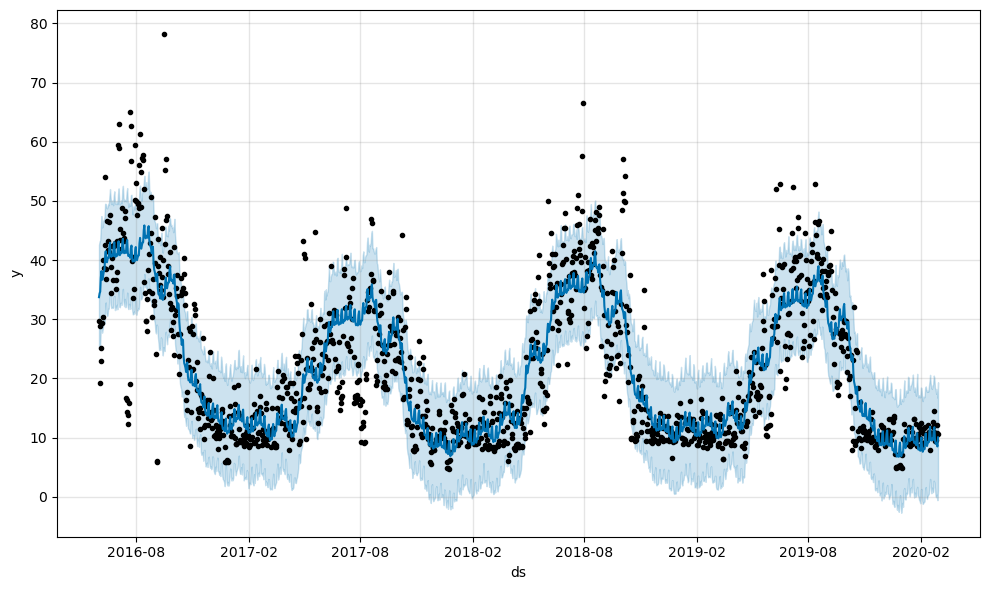

In [176]:
train_plot = prophet_model.plot(y_pred_prophet_train)

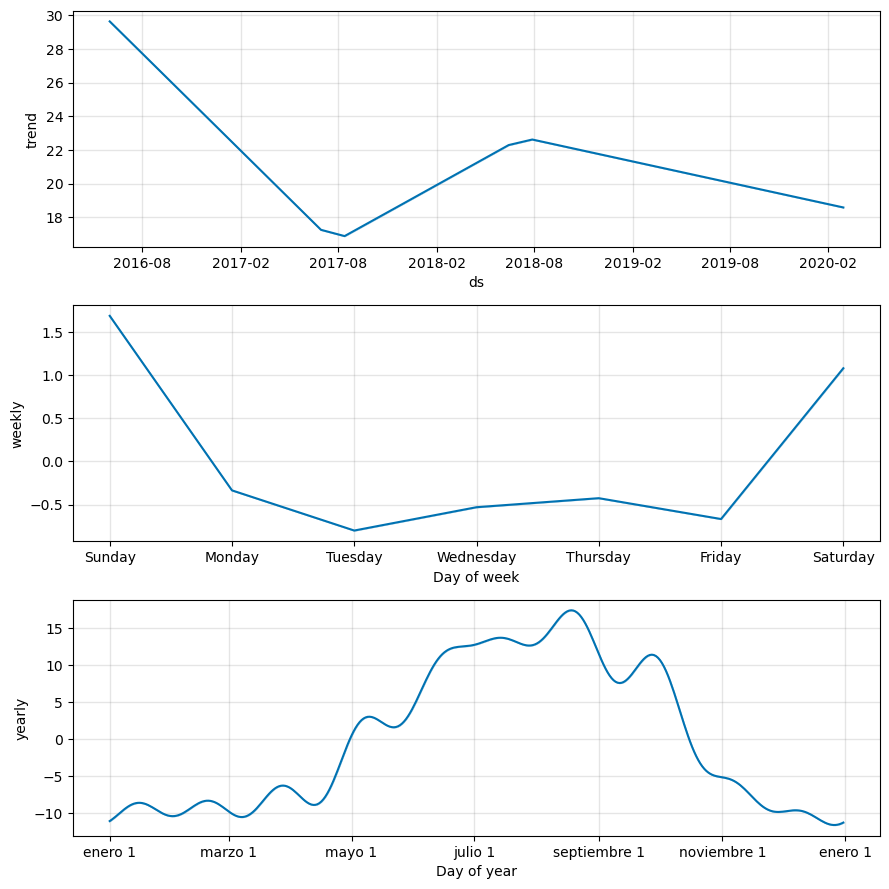

In [177]:
train_components = prophet_model.plot_components(y_pred_prophet_train)

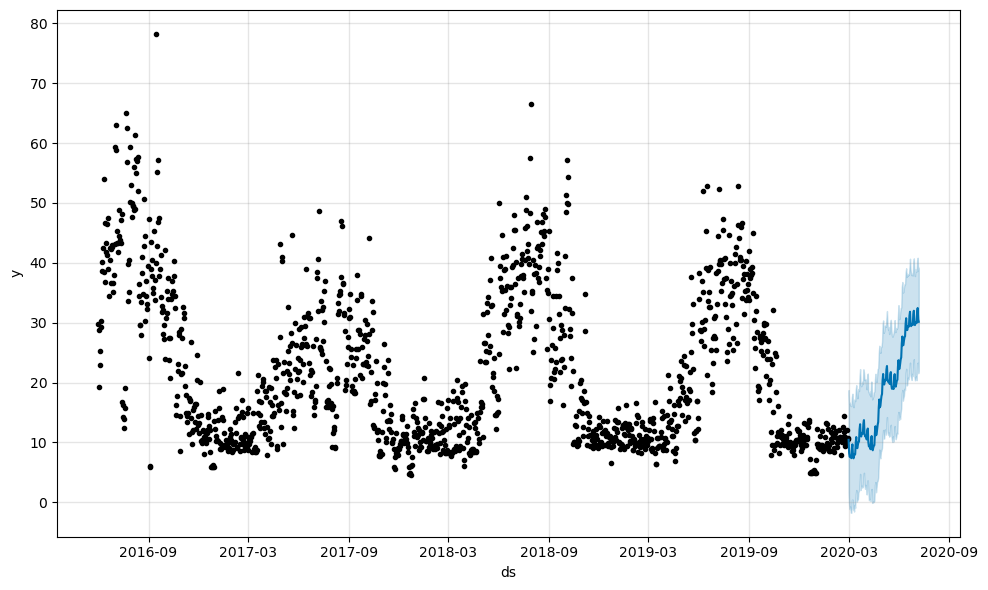

In [178]:
test_plot = prophet_model.plot(y_pred_prophet_test)

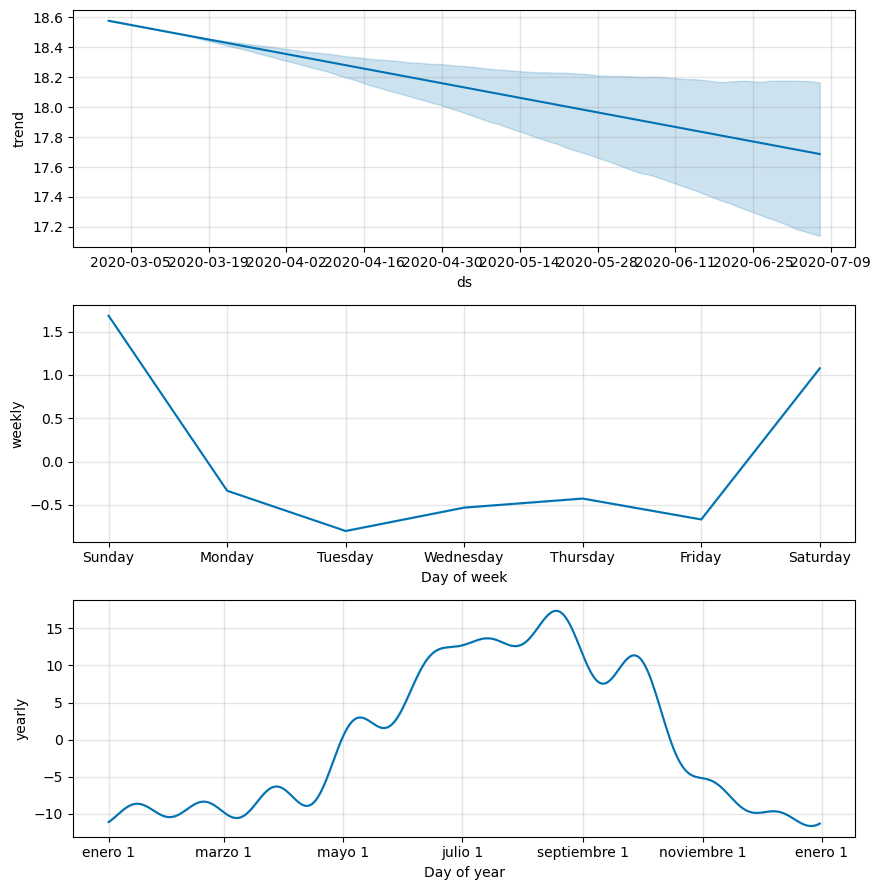

In [179]:
test_components = prophet_model.plot_components(y_pred_prophet_test)

4. Calcule el `MAE` de la predicción en el conjunto de entrenamiento y de prueba.

In [180]:
mae_train_prophet = mean_absolute_error(prophet_train['y'], y_pred_prophet_train['yhat'])
mae_test_prophet = mean_absolute_error(prophet_test['y'], y_pred_prophet_test['yhat'])

In [181]:
print(f'MAE Train Prophet: {mae_train_prophet}')
print(f'MAE Test Prophet: {mae_test_prophet}')

MAE Train Prophet: 4.82045569795681
MAE Test Prophet: 4.934028346974988


5. Grafique el error (Valor real - Valor predicho) en todo el intervalo de tiempo. Analice sus resultados y responda: ¿Hay un comportamiento estacional en la serie?

> **Respuesta**: En este caso, se puede ver que el error de predicción posee estacionalidad, pero es menos claro el patrón con respecto a los ítems anteriores, adicionalmente si se ve con respecto a fechas, es más difusa su tendencia con respecto a la alternativa vista con _Fourier_, la cual es especial para identificar patrones estacionarios por su cálculo basado en coeficientes de FFT.

In [182]:
error_train_prophet = prophet_train['y'] - y_pred_prophet_train['yhat']
error_test_prophet = prophet_test['y'] - y_pred_prophet_test['yhat']

total_error_prophet=pd.concat([
  pd.Series(error_train_prophet, index=prophet_train.index), 
  pd.Series(error_test_prophet, index=prophet_test.index)
]).reset_index(drop=True)
fig = px.line(
  x=prophet_df['ds'], 
  y=total_error_prophet, 
  title='Error de Predicción (Real - Predicho) (Prophet)',
  labels={'x': 'Fecha', 'y': 'Error (kWh)'}
)
fig.add_hline(
  y=0, 
  line_dash="dash", 
  line_color="red", 
  annotation_text="Error = 0"
)
fig.show()

## 1.4 Incluyendo Regresores [5 puntos]

<center>
<img src ="https://i.redd.it/64hwjftunjjd1.gif" width = 400 />

Con los nuevos resultados obtenidos del modelo Prophet, usted le aconseja a Homero que puede mejorar sus predicciones al incluir regresores en el modelo, es decir, variables adicionales que pueden influir en la variable objetivo, en este caso, el consumo energético. Homero encuentra que es una buena idea y va en busca de ayuda donde el Profesor Frink, un destacado Científico de Springfield. Para suerte de Homero, Frink tenía un estudio reciente que registra las condiciones climáticas en Springfield, en el mismo intervalo de tiempo en que Homero disponía de los datos de consumo eléctrico. Con esta nueva información, usted le recomienda a Homero que podrían utilizar esta información meteorológica proporcionada como variables exógenas al modelo.

Sin embargo, al no comprender bien la importancia de los regresores, Homero decide confiar en sus capacidades y le pide que, por favor, incluya estas variables en el modelo para evaluar su impacto en las predicciones.



Los datos del dataset de Frink son los siguientes:

* **date**: Fecha de medición.
* **Temp_max**: Temperatura máxima registrada durante el día (en °F).
* **Temp_avg**: Temperatura promedio registrada durante el día (en °F).
* **Temp_min**: Temperatura mínima registrada durante el día (en °F).
* **Dew_max**: Punto de rocío máximo registrado durante el día (en °F).
* **Dew_avg**: Punto de rocío promedio registrado durante el día (en °F).
* **Dew_min**: Punto de rocío mínimo registrado durante el día (en °F).
* **Hum_max**: Humedad máxima registrada durante el día (en porcentaje).
* **Hum_avg**: Humedad promedio registrada durante el día (en porcentaje).
* **Hum_min**: Humedad mínima registrada durante el día (en porcentaje).
* **Wind_max**: Velocidad máxima del viento registrada durante el día (en millas por hora, mph).
* **Wind_avg**: Velocidad promedio del viento registrada durante el día (en millas por hora, mph).
* **Wind_min**: Velocidad mínima del viento registrada durante el día (en millas por hora, mph).
* **Press_max**: Presión atmosférica máxima registrada durante el día (en pulgadas de mercurio, Hg).
* **Press_avg**: Presión atmosférica promedio registrada durante el día (en pulgadas de mercurio, Hg).
* **Press_min**: Presión atmosférica mínima registrada durante el día (en pulgadas de mercurio, Hg).

Para ello, usted debe:

0. Seleccionar las variables exógenas a utilizar del archivo `datos_frink.csv`. Añada estas variables a sus conjuntos de entrenamiento y prueba mediante `merge`. [0 puntos]

>**Respuesta**: Dado que existen diversas variables descriptoras del clima, se tomarán ciertas variables para analizar en base al supuesto de que Homero Simpson puede ser un gran fanático de la calefacción, por tanto la temperatura y humedad pueden tener un rol significativo en que utilice mayor electricidad al elegir este tipo de ventilación, como se puede ver en esta imagen.
>
> ![Homero y el aire acondicionado](https://i.ytimg.com/vi/9jIS_YZzbrQ/hqdefault.jpg)
>
> Por tanto, se eligió 'Temp_min', 'Temp_avg', 'Temp_max', 'Hum_avg', 'Hum_max' como variables exógenas a trabajar.
> 

In [183]:
frink=pd.read_csv('datos_frink.csv')
frink['date'] = pd.to_datetime(frink['date'])
regressors = ['Temp_max', 'Hum_max', 'Hum_avg', 'Temp_avg', 'Temp_min']
frink_regressors = frink[['date'] + regressors]
prophet_train_reg = prophet_train.merge(frink_regressors, left_on='ds', right_on='date', how='left')
prophet_test_reg = prophet_test.merge(frink_regressors, left_on='ds', right_on='date', how='left')


In [184]:
prophet_test_reg.drop(columns=['date'], inplace=True)
prophet_train_reg.drop(columns=['date'], inplace=True)

In [185]:
prophet_x_train_reg=prophet_train_reg[['ds'] + regressors]
prophet_x_test_reg=prophet_test_reg[['ds'] + regressors]

1. Cree el modelo Prophet e incluya los regresores (variables exógenas) al modelo. Luego realice el entrenamiento. **Hint**: Utilice el método `.add_regressor()`. Mas información en el siguiente [Enlace](https://facebook.github.io/prophet/docs/seasonality,_holiday_effects,_and_regressors.html#additional-regressors). [2 puntos]

**Respuesta:**

In [186]:
prophet_regression=Prophet()
prophet_regression.add_regressor('Temp_max')
prophet_regression.add_regressor('Hum_max')
prophet_regression.add_regressor('Hum_avg')
prophet_regression.add_regressor('Temp_avg')
prophet_regression.add_regressor('Temp_min')
prophet_regression.fit(prophet_train_reg)

2. Grafique las predicciones y las componentes del modelo Prophet. `Nota`: Utilice los métodos `.plot()` y `.plot_components()` de Prophet. [1 punto]


> **Nota**: Notar que al ejecutar este apartado, aparecen 2 gráficos, el inicial corresponde al modelo sin aplicar regresores y el segundo muestra el efecto de los regresores seleccionados para el caso.

In [187]:
y_pred_prophet_train_reg=prophet_regression.predict(prophet_x_train_reg)
y_pred_prophet_test_reg=prophet_regression.predict(prophet_x_test_reg)

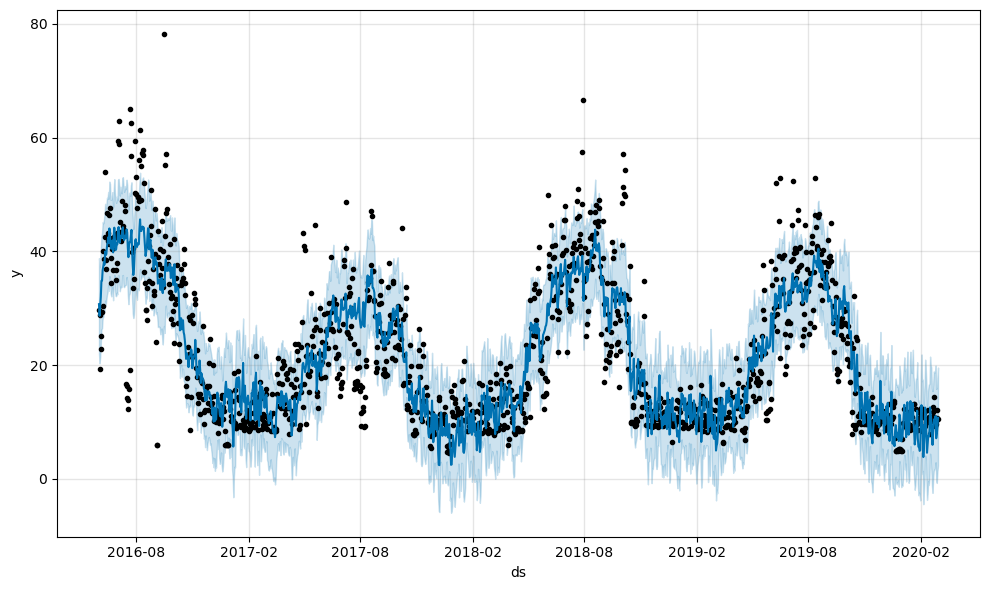

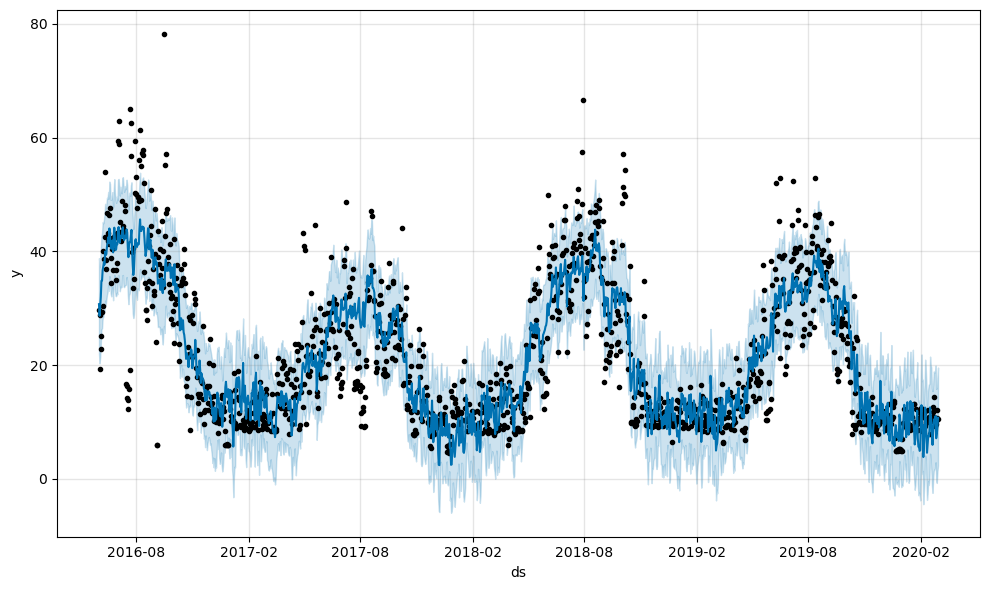

In [188]:
prophet_regression.plot(y_pred_prophet_train_reg)

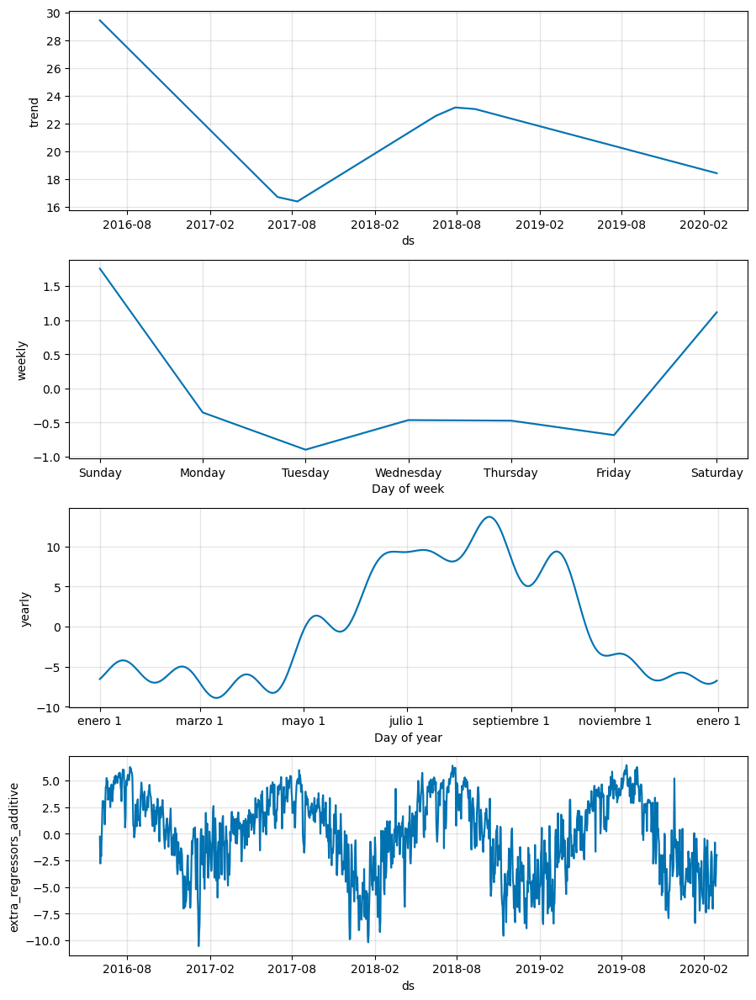

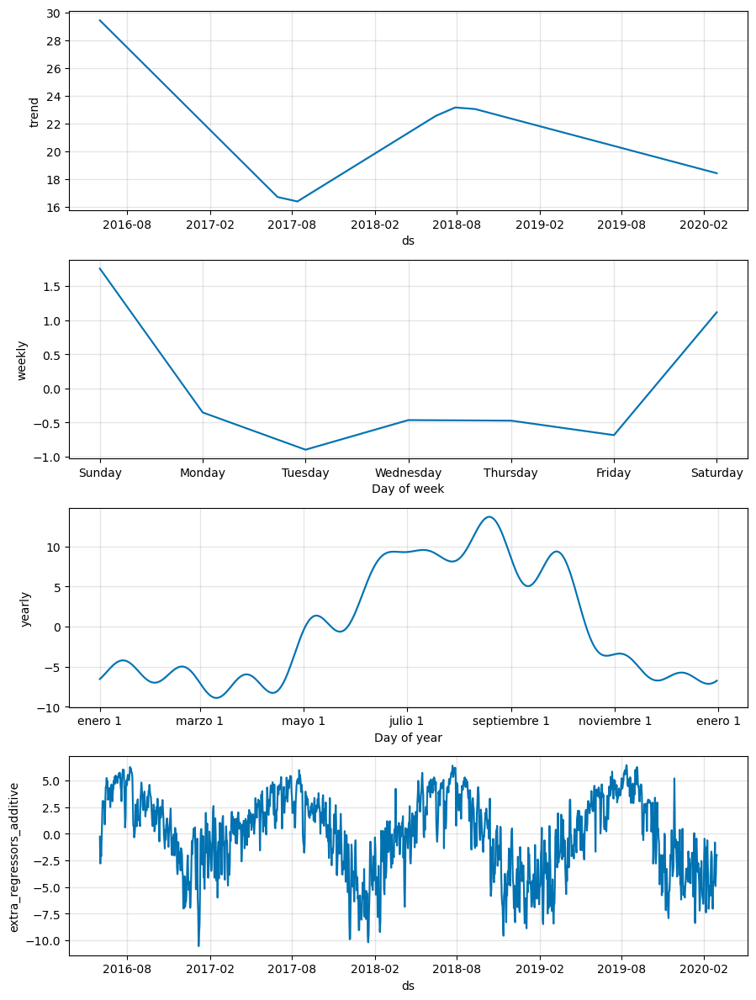

In [189]:
prophet_regression.plot_components(y_pred_prophet_train_reg)

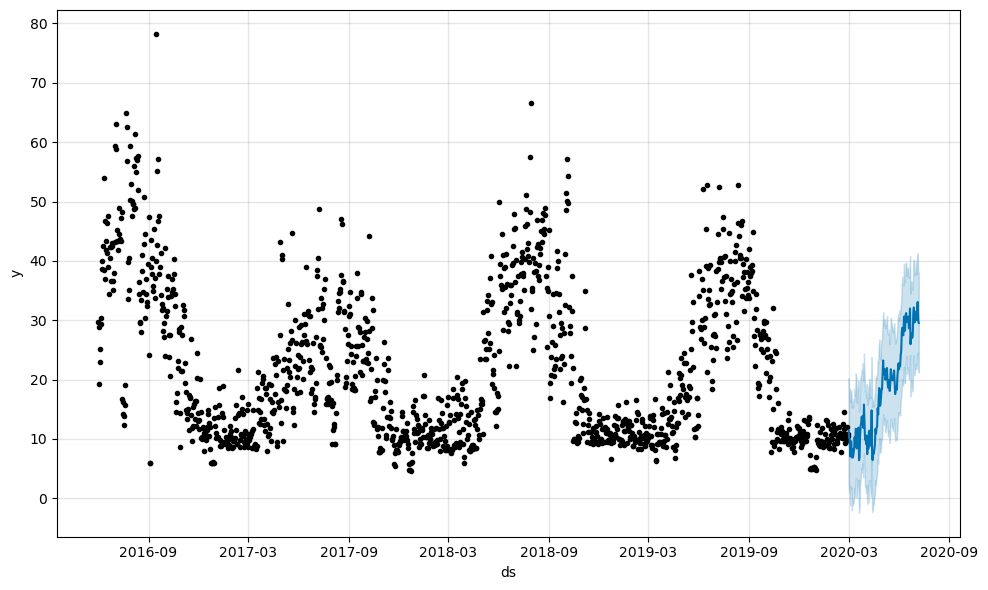

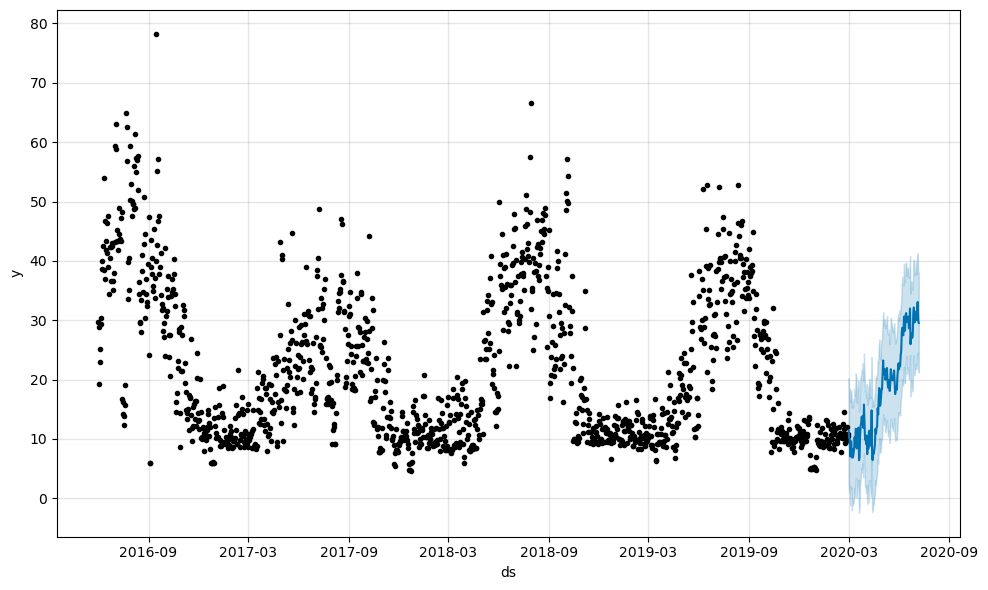

In [190]:
prophet_regression.plot(y_pred_prophet_test_reg)

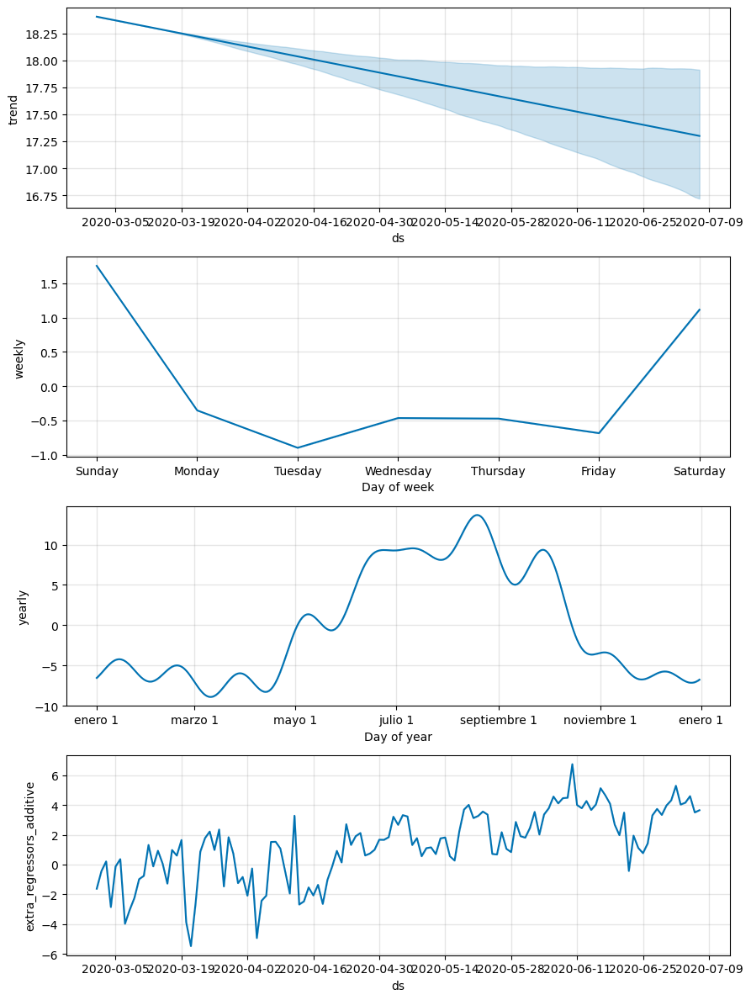

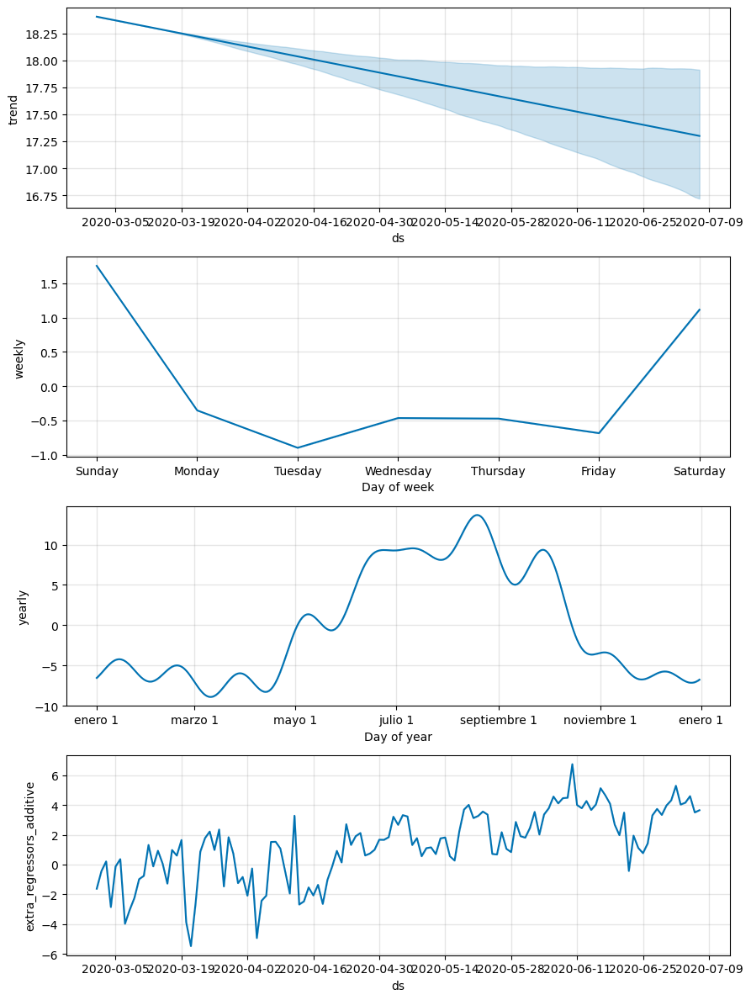

In [191]:
prophet_regression.plot_components(y_pred_prophet_test_reg)

3. Calcule el `MAE` de la predicción en el conjunto de entrenamiento y de prueba. Analice sus resultados. [1 punto]


In [192]:
mae_train_reg = mean_absolute_error(prophet_train_reg['y'], y_pred_prophet_train_reg['yhat'])
mae_test_reg = mean_absolute_error(prophet_test_reg['y'], y_pred_prophet_test_reg['yhat'])

In [193]:
print(f'MAE Train Prophet: {mae_train_prophet}')
print(f'MAE Test Prophet: {mae_test_prophet}')
print(f'MAE Train Prophet con regresores: {mae_train_reg}')
print(f'MAE Test Prophet con regresores: {mae_test_reg}')

MAE Train Prophet: 4.82045569795681
MAE Test Prophet: 4.934028346974988
MAE Train Prophet con regresores: 4.7205221930103525
MAE Test Prophet con regresores: 4.554015817808741


>**Respuesta**: En comparativa con el modelo sin uso de variables exógenas, podemos decir que el modelo que incorporó nueva información, capturó de mejor forma las tendencias, ya que su error absoluto medio es menor, sin embargo, considerando que se agregaron 5 variables, se puede decir que el impacto de esta nueva información fue significativo, ya que el error disminuyó en ambos conjuntos.
>
> A diferencia con $R^2$, el cálculo del MAE no se ve directamente influenciado por la cantidad de variables entregadas, así que podemos afirmar que el agregar variables exógenas, permite mejorar el rendimiento del _forecasting_ para Homero Simpson.

4. Grafique el error (Valor real - Valor predicho) en el conjunto de entrenamiento y de prueba. ¿Hay un comportamiento estacional en la serie? ¿Influyen estas variables en el comportamiento del consumo energético en el hogar de Homero? [1 punto]

> **Respuesta:** Analizando inicialmente, se puede decir que mantiene estacionalidad, muy similar al caso de _Prophet_, sin embargo, existe una influencia en el error, la cual se puede notar en el último gráfico, donde se comparan ambos errores y se puede apreciar que mejora con respecto al uso de _Prophet_ sin regresores, por tanto, en base a esto, dado que las predicciones se ajustan de mejor forma a la realidad, se puede afirmar que las variables seleccionadas modelan con más precisión el comportamiento del consumo energético de Homero Simpson. Es decir, influye en el comportamiento inicialmente, pero es un supuesto en base al modelado.

In [194]:
error_train_prophet_reg = prophet_train_reg['y'] - y_pred_prophet_train_reg['yhat']
error_test_prophet_reg = prophet_test_reg['y'] - y_pred_prophet_test_reg['yhat']

total_error_prophet_reg=pd.concat([
  pd.Series(error_train_prophet_reg, index=prophet_train_reg.index), 
  pd.Series(error_test_prophet_reg, index=prophet_test_reg.index)
]).reset_index(drop=True)
fig = px.line(
  x=prophet_df['ds'], 
  y=total_error_prophet_reg, 
  title='Error de Predicción (Real - Predicho) (Prophet con regresores)',
  labels={'x': 'Fecha', 'y': 'Error (kWh)'}
)
fig.add_hline(
  y=0, 
  line_dash="dash", 
  line_color="red", 
  annotation_text="Error = 0"
)
fig.show()

In [195]:
fig.add_scatter(
  x=prophet_df['ds'], 
  y=total_error_prophet, 
  mode='lines', 
  name='Prophet'
)
fig.show()

## 1.5 Aplicando Lags [7 puntos]

<center>
<img src ="https://i.gifer.com/J45h.gif" width = 400 />

Homero, satisfecho con los resultados obtenidos, cree que aún puede mejorar el rendimiento del modelo incorporando lags de las variables exógenas. Se le ocurre que, al incluir estos lags, podría identificar cómo los valores pasados de las variables influyen en la evolución de la variable objetivo. Con esta idea en mente, Homero solicita su ayuda para encontrar y aplicar los lags adecuados a las variables exógenas de manera efectiva.

Para ello, a usted se le pide que:

1. Calcule la `Autocorrelación Parcial` de las variables exógenas `avg` que usted haya considerado. Por ejemplo: `Temp_avg, Dew_avg, etc`. Luego determine la cantidad de rezagos (lags) que se va a aplicar a cada una de las variables. Justifique. [1 punto]




**Respuesta:**

In [196]:
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import pacf
import matplotlib.pyplot as plt


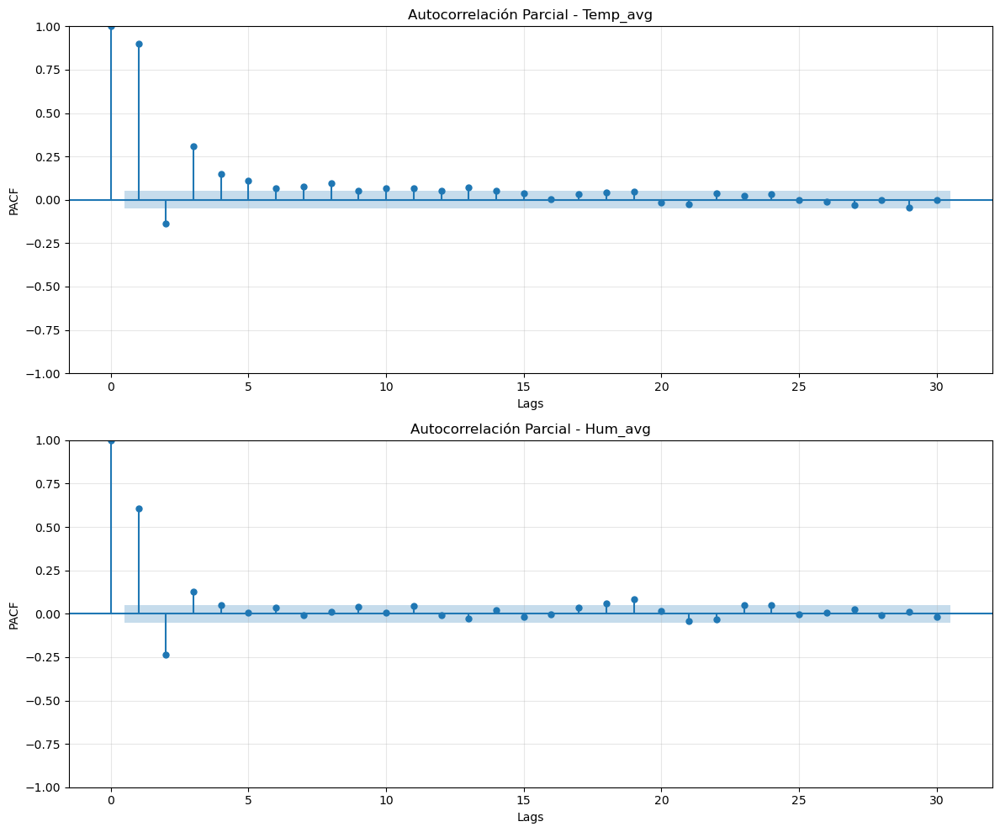

In [197]:
avg_vars = ['Temp_avg', 'Hum_avg']
fig, axes = plt.subplots(len(avg_vars), 1, figsize=(12, 10))
lags_dict = {}
for i, var in enumerate(avg_vars):
    pacf_values = pacf(frink[var].dropna(), nlags=30)
    ax = axes[i] if len(avg_vars) > 1 else axes
    plot_pacf(frink[var], lags=30, alpha=0.05, ax=ax)
    ax.set_title(f'Autocorrelación Parcial - {var}')
    ax.set_xlabel('Lags')
    ax.set_ylabel('PACF')
    ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

> **Respuesta**: En base a los gráficos realizados, se tomarán 5 dias de _lag_ para la variable `Temp_avg` y 4 días de _lag_ para `Hum_avg`, dado que posterior a esta cantidad de _lag_, la diferencia no se aprecia significativamente, ya que entran a partir de ese caso en el intérvalo, por tanto se hará en base a estos valores, es decir, como el gráfico muestra la autocorrelación parcial con una significancia estadística de $95/%$, se puede afirmar que para los datos que tenemos, la cantidad de _lags_ seleccionados va a tener efecto significativo.

2. Aplique los lags determinados en el paso anterior e incluyalos como variables en los conjuntos train y test. [1 punto]



In [198]:
lags_dict = {
    'Temp_avg': [1, 2, 3, 4, 5],
    'Hum_avg': [1, 2, 3, 4]
}
def create_lagged_features(df, variable, lag):
    df_lagged = df.copy()
    df_lagged[f'{variable}_lag{lag}'] = df_lagged[variable].shift(lag)
    return df_lagged

prophet_df_lag = prophet_df.merge(frink_regressors, left_on='ds', right_on='date', how='left')
prophet_df_lag.drop(columns=['date'], inplace=True)

for var, num_lags in lags_dict.items():
    for lag in num_lags:
        prophet_df_lag = create_lagged_features(prophet_df_lag, var, lag)

prophet_train_lag = prophet_df_lag[prophet_df_lag['ds'] <= train_limit]
prophet_test_lag = prophet_df_lag[prophet_df_lag['ds'] >= test_limit]
prophet_x_train_lag = prophet_train_lag.drop(columns=['y'])
prophet_x_test_lag = prophet_test_lag.drop(columns=['y'])

3. Impute los valores nulos de los nuevos atributos lags mediante la media de cada variable. [1 punto]


In [199]:
from sklearn.impute import SimpleImputer

In [200]:
lag_columns = [
  f'Temp_avg_lag{lag}' for lag in lags_dict['Temp_avg']
] + [
  f'Hum_avg_lag{lag}' for lag in lags_dict['Hum_avg']
]
imputer = SimpleImputer(strategy='mean')
imputer.fit(prophet_train_lag[lag_columns])
prophet_train_lag[lag_columns] = imputer.transform(prophet_train_lag[lag_columns])
prophet_test_lag[lag_columns] = imputer.transform(prophet_test_lag[lag_columns])
prophet_x_train_lag[lag_columns] = prophet_train_lag[lag_columns]
prophet_x_test_lag[lag_columns] = prophet_test_lag[lag_columns]

C:\Users\max02\AppData\Local\Temp\ipykernel_24980\2060013063.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\max02\AppData\Local\Temp\ipykernel_24980\2060013063.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



4. Cree y entrene el modelo Prophet e incluya las variables exógenas y adicionalmente sus respectivos lags al modelo. [1 punto]


In [201]:
prophet_lag = Prophet()
prophet_lag.add_regressor('Temp_max')
prophet_lag.add_regressor('Hum_max')
prophet_lag.add_regressor('Temp_min')
for lag in lags_dict['Temp_avg']:
  prophet_lag.add_regressor(f'Temp_avg_lag{lag}')
for lag in lags_dict['Hum_avg']:
  prophet_lag.add_regressor(f'Hum_avg_lag{lag}')
prophet_lag.fit(prophet_train_lag)


5. Grafique las predicciones y las componentes del modelo Prophet. `Nota`: Utilice los métodos `.plot()` y `.plot_components()` de Prophet. [1 punto]


In [202]:
y_pred_prophet_train_lag = prophet_lag.predict(prophet_x_train_lag)
y_pred_prophet_test_lag = prophet_lag.predict(prophet_x_test_lag)

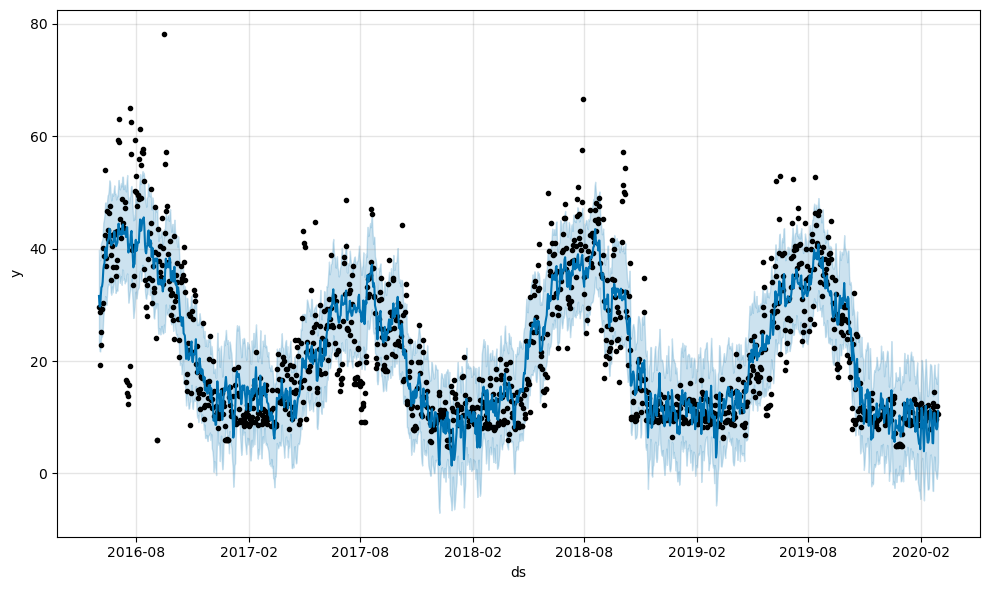

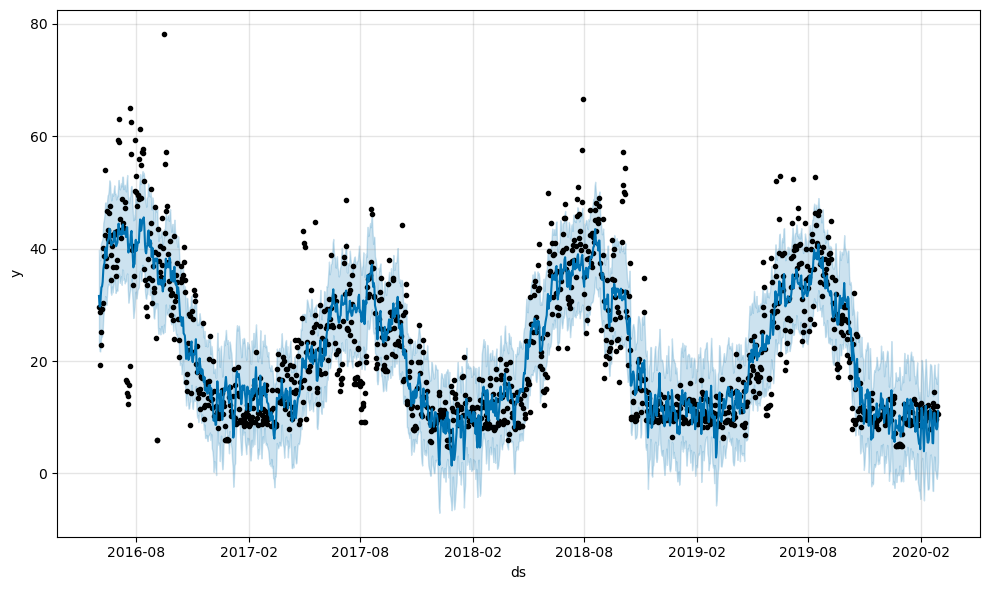

In [203]:
prophet_lag.plot(y_pred_prophet_train_lag)

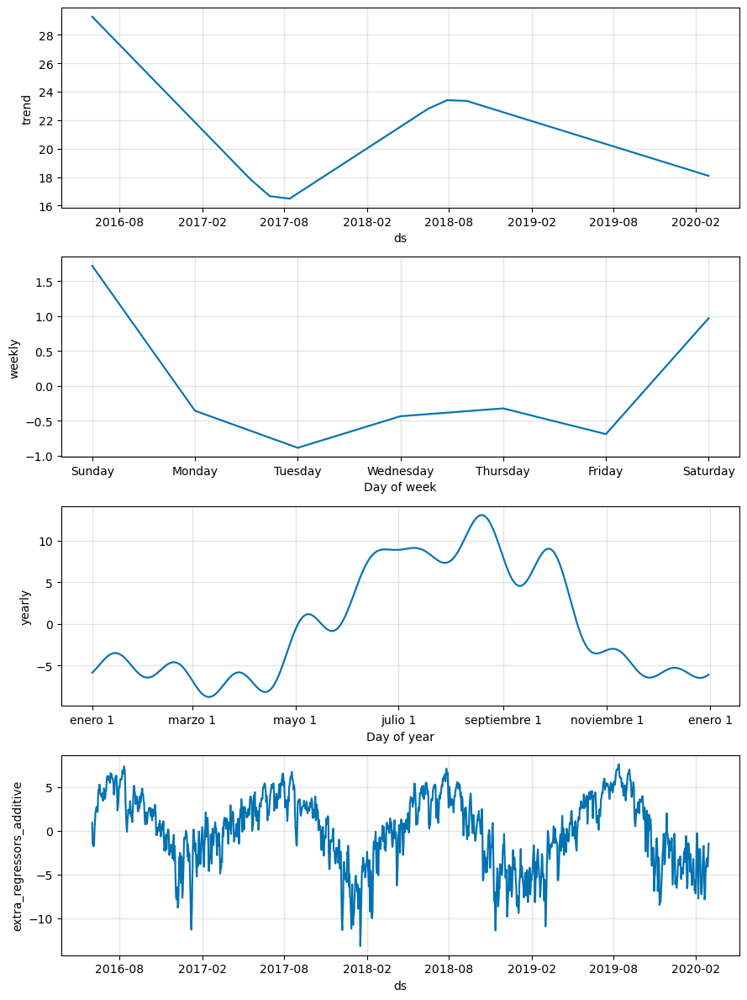

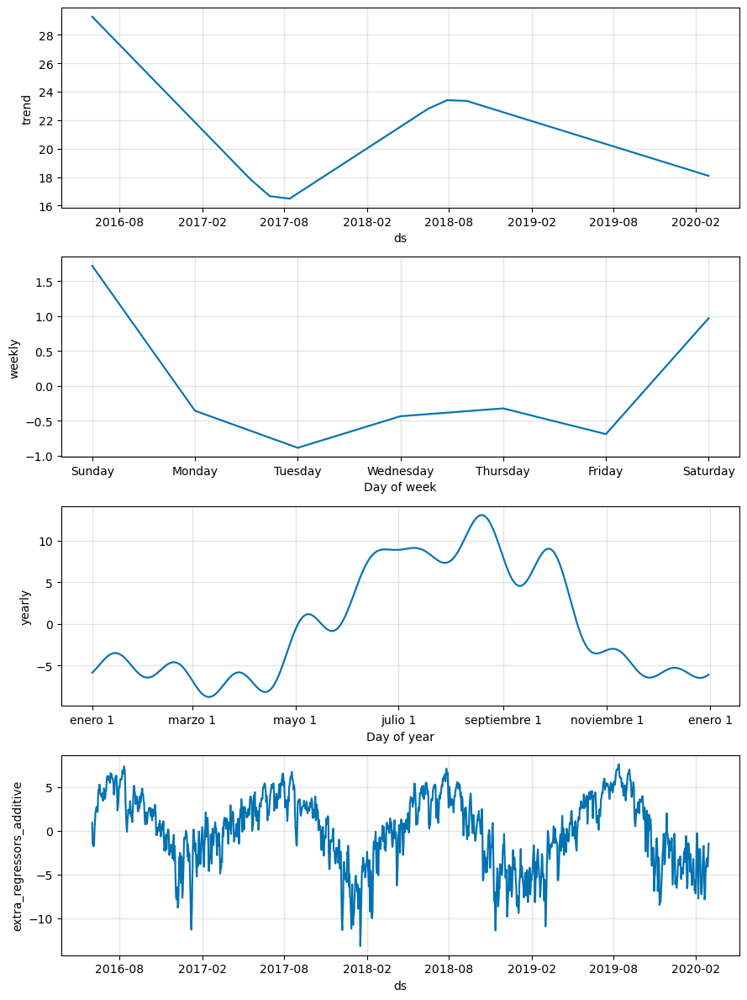

In [204]:
prophet_lag.plot_components(y_pred_prophet_train_lag)

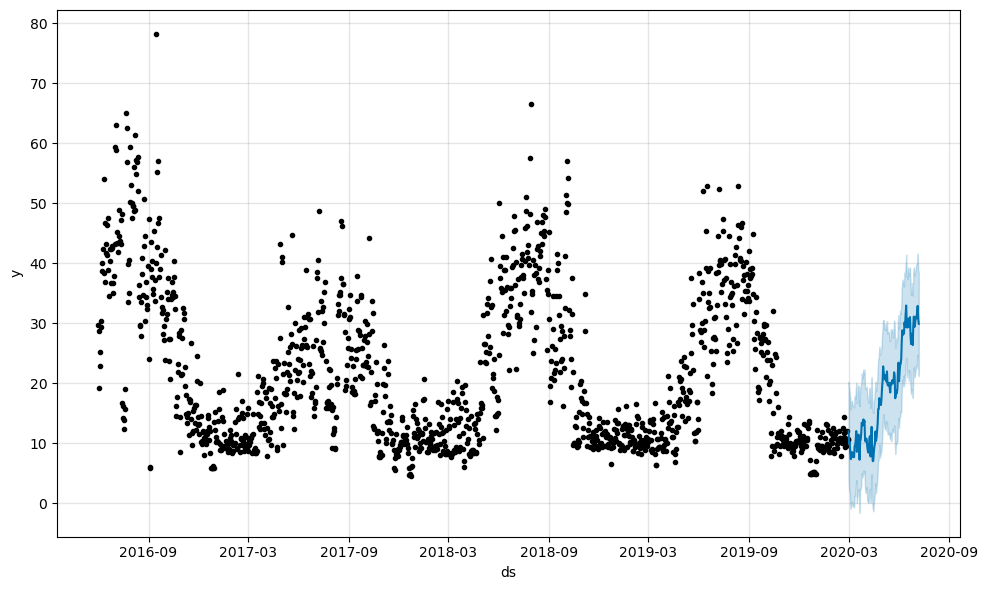

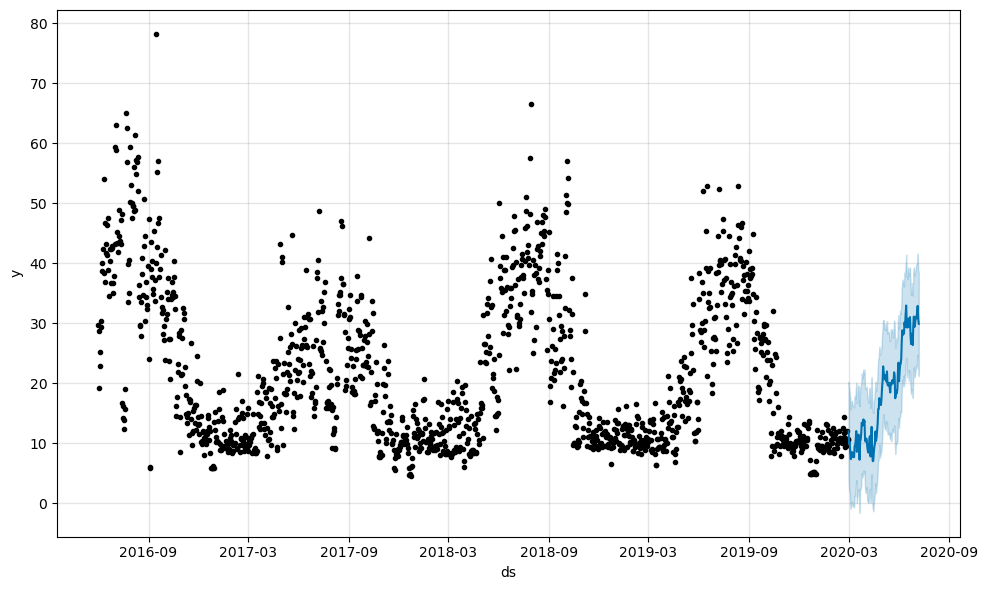

In [205]:
prophet_lag.plot(y_pred_prophet_test_lag)

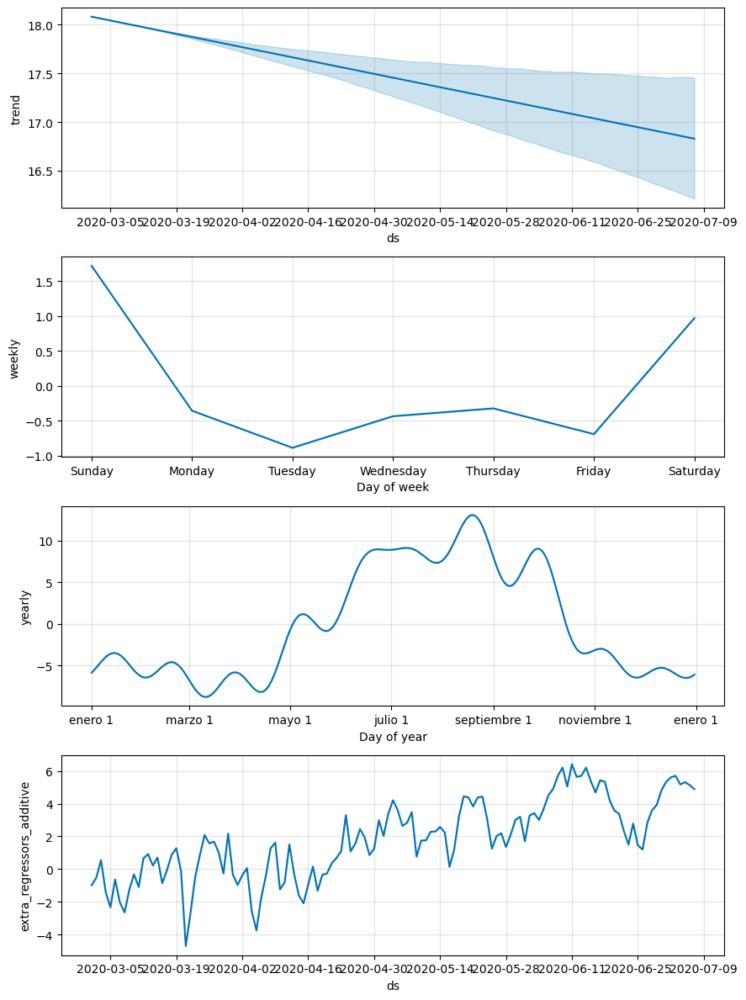

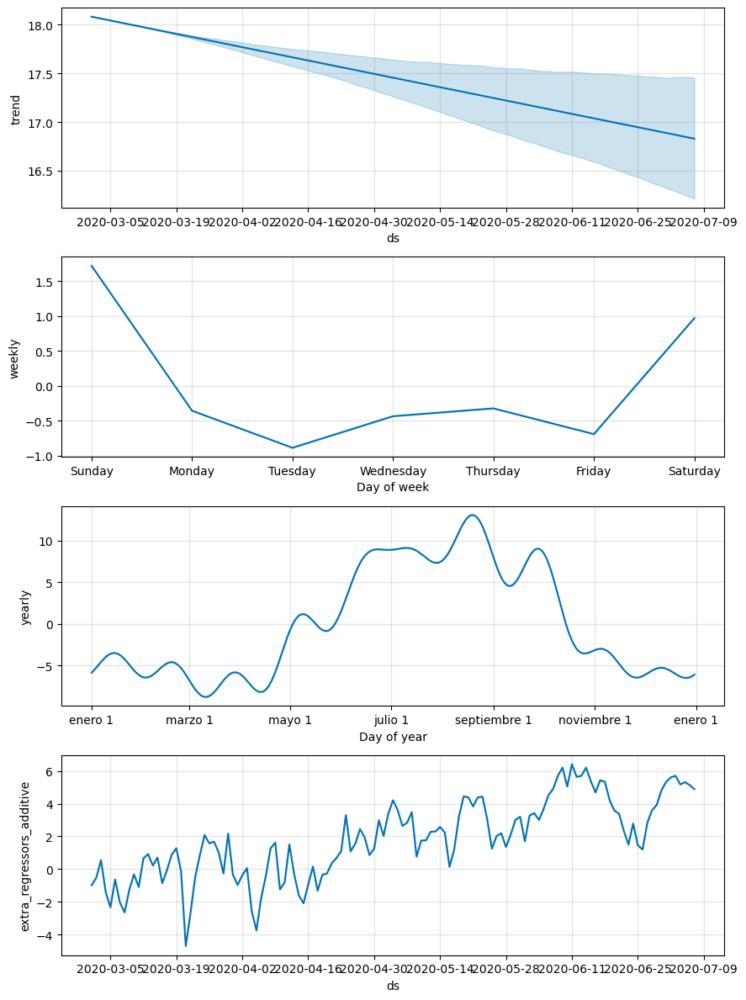

In [206]:
prophet_lag.plot_components(y_pred_prophet_test_lag)

6. Calcule el `MAE` de la predicción en el conjunto de prueba y en el de entrenamiento. Analice sus resultados. [1 punto]


In [207]:
mae_lag_train = mean_absolute_error(prophet_train_lag['y'], y_pred_prophet_train_lag['yhat'])
mae_lag_test = mean_absolute_error(prophet_test_lag['y'], y_pred_prophet_test_lag['yhat'])

In [208]:
print(f'MAE Train Prophet: {mae_train_prophet}')
print(f'MAE Test Prophet: {mae_test_prophet}')
print(f'MAE Train Prophet con Lag y regresores: {mae_lag_train}')
print(f'MAE Test Prophet con Lag y regresores: {mae_lag_test}')

MAE Train Prophet: 4.82045569795681
MAE Test Prophet: 4.934028346974988
MAE Train Prophet con Lag y regresores: 4.723370008583512
MAE Test Prophet con Lag y regresores: 4.494779096661834


> **Respuesta**: El MAE mejoró considerablemente con respecto a la versión original, superándola por 5 centésimas, siendo el mejor valor obtenido hasta ahora en todos los experimentos. A pesar de que en _train_ la mejora no es tan significativa, en _test_ sí lo es, lo que indica un mejor poder de generalización.

7. Grafique el error (Valor real - Valor predicho) en el conjunto de entrenamiento y en el de prueba. ¿Hay un comportamiento estacional en la serie? ¿Como afecta la inclusión de los lags en el desempeño del modelo? [1 punto]

In [209]:
error_train_prophet_lag = prophet_train_lag['y'] - y_pred_prophet_train_lag['yhat']
error_test_prophet_lag = prophet_test_lag['y'] - y_pred_prophet_test_lag['yhat']

total_dates = pd.concat([prophet_train_lag['ds'], prophet_test_lag['ds']]).reset_index(drop=True)
total_error_prophet_lag=pd.concat([
  pd.Series(error_train_prophet_lag, index=prophet_train_lag.index), 
  pd.Series(error_test_prophet_lag, index=prophet_test_lag.index)
]).reset_index(drop=True)

fig = px.line(
  x=total_dates, 
  y=total_error_prophet_lag , 
  title='Error de Predicción (Real - Predicho) (Prophet con regresores y lags)',
  labels={'x': 'Fecha', 'y': 'Error (kWh)'}
)
fig.add_hline(
  y=0, 
  line_dash="dash", 
  line_color="red", 
  annotation_text="Error = 0"
)
fig.show()

>**Respuesta**: Se puede notar que se mantiene la noción de estacionalidad de las series anteriores en este caso, aunque sigue siendo menos notoria que en el caso inicial, sin embargo, al introducir _lags_, el error disminuye y la temporalidad se mantiene bastante similar a la de _Prophet_ sin lags. Por tanto, existe estacionalidad en la serie con _lags_. Al incluir los lags como parte de los regresores, se puede apreciar una leve diferencia global en el error de predicción durante la serie.
>
> Por tanto, analizando _MAE_ y este gráfico, se puede concluir que el agregar _lags_ mejoró el desempeño del modelo en ambos casos, destacando en _test_, dado que el _MAE_ disminuyó considerablemente.

## 1.6 Optimizando Prophet [6 puntos]

<center>
<img src ="https://i.gifer.com/BKlg.gif" width = 500 />

Homero, contento con sus resultados, decide compartir su trabajo en LinkedIn. Sin embargo, justo antes de realizar la publicación, su hija Lisa Simpson le comenta que su modelo podría mejorar aún más mediante la optimización de hiperparámetros. Aunque Homero no entiende muy bien a qué se refiere Lisa, decide confiar en su conocimiento y le pide ayuda para implementar la optimización.

Lisa le prepara una función llamada optimize_prophet, que recibe como entrada el registro histórico, los datos a predecir (futuros), el nombre de las variables exógenas y una grilla de hiperparámetros que se desea modificar.

Después de varios intentos, Homero no logra utilizar la función de Lisa y, desesperado por publicar sus resultados en internet, se acerca a usted en busca de ayuda.

Para ello, usted decide realizar los siguientes pasos:

1. Crear una grilla donde se modifiquen los siguientes hiperparámetros: `changepoint_prior_scale`, `seasonality_prior_scale`, `seasonality_mode`, `changepoint_range` y encuentre los hiperparámetros que optimicen el `MAE`. `Nota:` Utilice la función `optimize_prophet()` dada en el enunciado. [1 punto]
2. Crear y entrenar un modelo Prophet utilizando los mejores parámetros encontrados, incluyendo regresores (variables exógenas). [2 puntos]
3. Grafique las predicciones y las componentes del modelo Prophet. `Nota`: Utilice los métodos `.plot()` y `.plot_components()` de Prophet. [1 punto]
4. Calcule el `MAE` de la predicción en el conjunto de entrenamiento y en el de prueba. [1 punto]
5. Grafique el error (Valor real - Valor predicho) en ambos conjuntos. Analice sus resultados. [1 punto]


In [210]:
import itertools
import numpy as np
import pandas as pd
from tqdm import tqdm
import logging

# Silenciar el logging de Prophet
logging.getLogger('prophet').setLevel(logging.ERROR)
logging.getLogger('cmdstanpy').setLevel(logging.ERROR)


def optimize_prophet(df, df_to_pred, features, param_grid ):
  '''
  Función que recibe como entrada:
  -df: data entrenamiento.
  -df_to_pred: data a predecir (test).
  -features: lista de variables exógenas.
  -param_grid: grilla de hiperparámetros.

  Retorna:
  -tuning_results: Dataframe con resultados de la optimización.
  -best_params: Diccionario de mejores parámetros encontrados.
  '''

  # Generate all combinations of parameters
  all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
  MAEs = []  # Store the MAEs for each params here

  # Use tqdm to add a progress bar to the parameter tuning loop
  for params in tqdm(all_params, desc="Tuning Prophet parameters"):
      m = Prophet(**params)  # Fit model with given params
      for feature in features:
          m.add_regressor(feature)
      m.fit(df)

      # Prepare future dataframe
      df_prop = m.make_future_dataframe(periods=len(df_to_pred))
      df_feat = pd.concat([df[features], df_to_pred[features]]).reset_index(drop=True)
      df_prop[features] = df_feat[features]

      # Make predictions
      forecast = m.predict(df_prop)
      forecast_pred = forecast[forecast['ds'].isin(df_to_pred['ds'])].reset_index(drop=True)

      # Calculate MAE for the predictions
      mae_pred = mean_absolute_error(df_to_pred['y'], forecast_pred['yhat'])
      MAEs.append(mae_pred)

  # Find the best parameters
  tuning_results = pd.DataFrame(all_params)
  tuning_results['MAEs'] = MAEs
  tuning_results = tuning_results.sort_values(by='MAEs', ascending=True)
  best_params = all_params[np.argmin(MAEs)]
  return tuning_results, best_params

### Desarrollo

Tuning Prophet parameters: 100%|██████████| 24/24 [00:21<00:00,  1.11it/s]


MAE Train con Prophet optimizado: 4.82045569795681
MAE Test con Prophet optimizado: 4.934028346974988


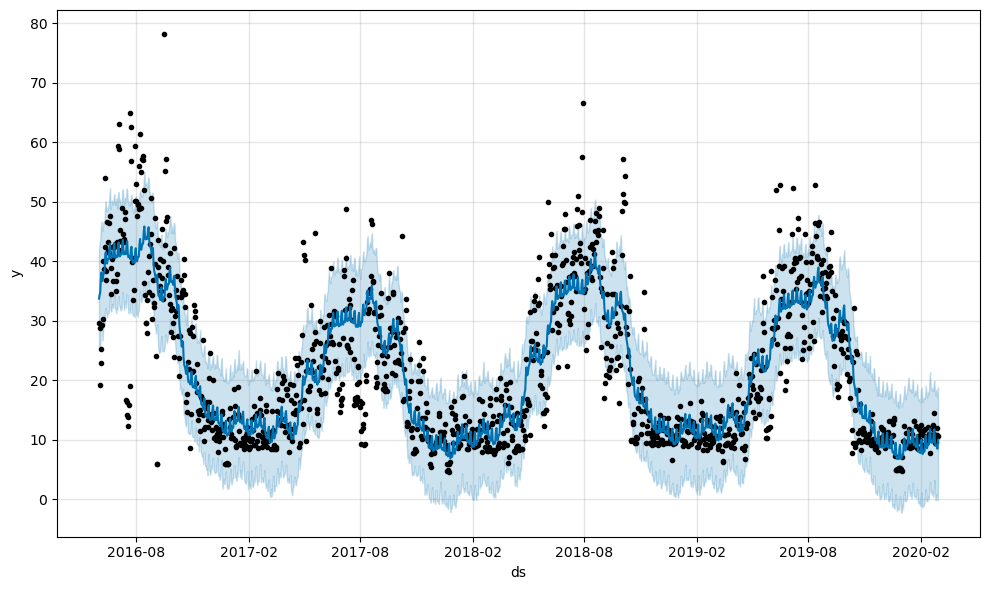

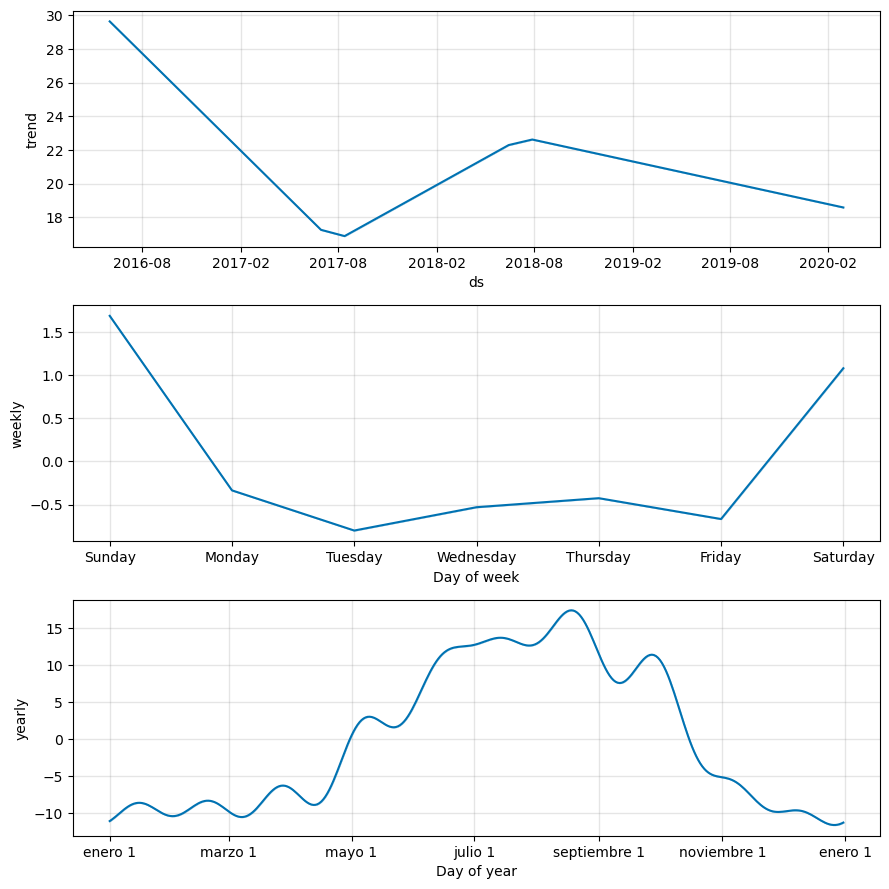

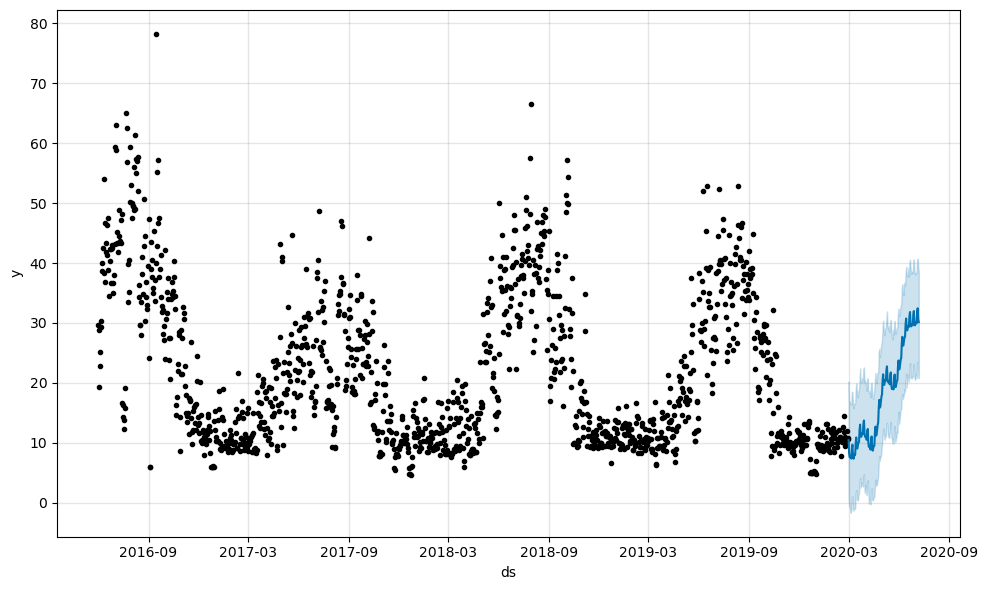

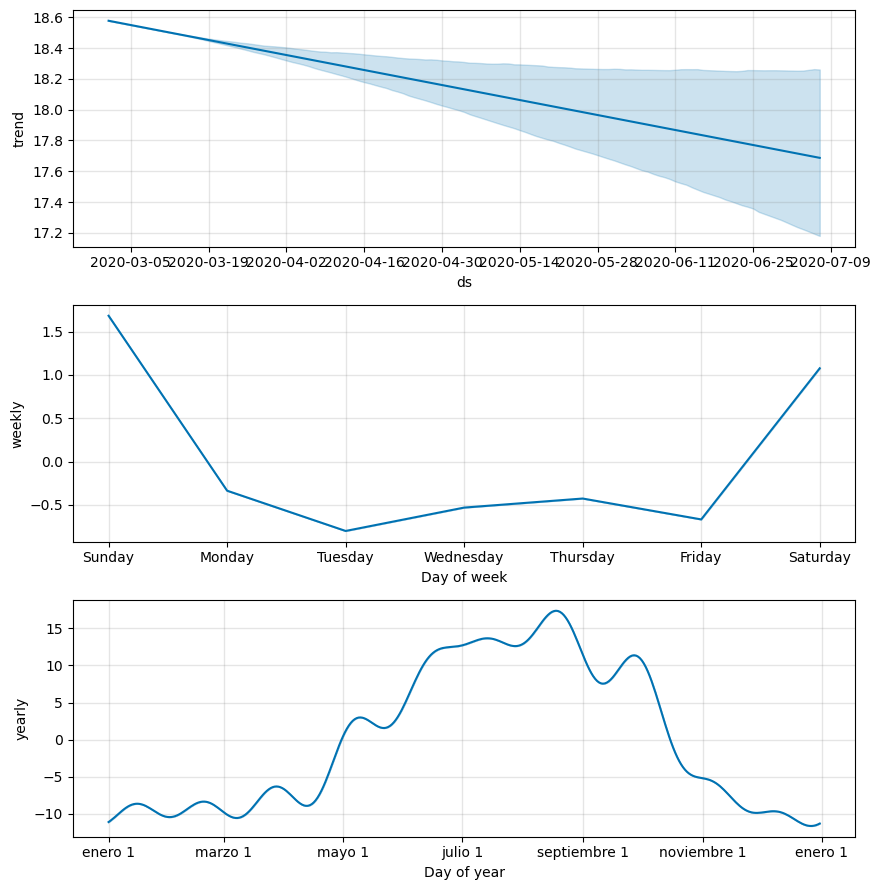

In [243]:
# 1.
 
# Exogenous features with lagged variables
lagged_exogenous = [
  'Temp_max',
  'Hum_max',
  'Temp_min'
] + [
  f'Temp_avg_lag{lag}' for lag in lags_dict['Temp_avg']
] + [
  f'Hum_avg_lag{lag}' for lag in lags_dict['Hum_avg']
]
 
param_grid = {
  'changepoint_prior_scale': [0.01, 0.1, 0.5],
  'seasonality_mode': ['additive', 'multiplicative'],
  'seasonality_prior_scale': [1.0, 10.0],
  'changepoint_range': [0.8, 0.9]
}
 
tuning_results, best_params = optimize_prophet(
  prophet_train_lag,
  prophet_test_lag,
  features=lagged_exogenous,
  param_grid=param_grid
)
 
# 2.
model = Prophet(**best_params)
for variable in lagged_exogenous:
  model.add_regressor(variable)
 
model.fit(prophet_train_lag)
 
# 3.
y_pred_prophet_train = prophet_model.predict(prophet_x_train_lag)
y_pred_prophet_test = prophet_model.predict(prophet_x_test_lag)
 
prophet_model.plot(y_pred_prophet_train)
prophet_model.plot_components(y_pred_prophet_train)
 
prophet_model.plot(y_pred_prophet_test)
prophet_model.plot_components(y_pred_prophet_test)
 
# 4.
mae_train_prophet = mean_absolute_error(prophet_train['y'], y_pred_prophet_train['yhat'])
mae_test_prophet = mean_absolute_error(prophet_test['y'], y_pred_prophet_test['yhat'])
 
print(f'MAE Train con Prophet optimizado: {mae_train_prophet}')
print(f'MAE Test con Prophet optimizado: {mae_test_prophet}')
 
# 5.
error_train_prophet = prophet_train_lag['y'] - y_pred_prophet_train['yhat']
error_test_prophet = prophet_test_lag['y'] - y_pred_prophet_test['yhat']
total_error_prophet=pd.concat([
  pd.Series(error_train_prophet, index=prophet_train_lag.index), 
  pd.Series(error_test_prophet, index=prophet_test_lag.index)
]).reset_index(drop=True)
fig = px.line(
  x=prophet_df['ds'], 
  y=total_error_prophet, 
  title='Error de Predicción (Real - Predicho) (Prophet Optimizado)',
  labels={'x': 'Fecha', 'y': 'Error (kWh)'}
)
fig.add_hline(
  y=0, 
  line_dash="dash", 
  line_color="red", 
  annotation_text="Error = 0"
)
fig.show()

> **Respuesta**: Los errores aumentaron levemente con respecto a la versión que implementaba el _lag_ sin optimización, lo que indica que la optimización de hiperparámetros no fue exitosa. Como trabajo futuro, se sugiere probar con otros valores para la grilla, que se ajusten más al problema.

# **2. Sistemas de Recomendación (30 puntos)**

## Homero contra la Prohibición

<center>
<img src ="https://i.ytimg.com/vi/rMSXXuhZjYY/maxresdefault.jpg" width = 500 />

En Springfield, el caos estalló cuando las autoridades prohibieron el alcohol. Pero como siempre, donde otros ven problemas, Homero Simpson ve oportunidades. Decidido a mantener las fiestas vivas, se convirtió en el Barón de la Cerveza en un abrir y cerrar de ojos. Con la ayuda de su buen amigo Moe el cantinero, Homero obtuvo un valioso dataset llamado `cervezas.csv`, que contiene valoraciones de los ciudadanos de Springfield sobre distintas cervezas. Homero quiere asegurarse de ofrecer las cervezas más apreciadas para mantener a su clientela oculta y feliz, mientras eludía la mirada del estricto Elio Pez. Por ende, Homero lo contacta para solicitar de su ayuda en esta nueva labor.

El dataset contiene los siguientes atributos:

  * userId: Identificador de los ciudadanos/usuarios
  * beerId: Identificador único de cada cerveza
  * rating: Evaluación otorgada por el ciudadano a la cerveza, en un rango de 1.0 a 5.0.
  * beerName: Nombre de la cerveza
  * beerStyle: Tipo de Cerveza.



In [212]:
from sklearn.preprocessing import LabelEncoder

from surprise import accuracy
from surprise.reader import Reader
from surprise.dataset import Dataset
from surprise.prediction_algorithms.knns import KNNBasic
from surprise.prediction_algorithms.matrix_factorization import SVD
from surprise.accuracy import mae
from surprise import NMF
from collections import defaultdict

import pandas as pd
from copy import deepcopy

## Carga de los datos [0 puntos]

Cargue el dataset `cervezas.csv` y realice una breve exploración de los datos. ¿Hay valores nulos? ¿Cuantos cervezas se estan evaluando? ¿Cuantos ciudadanos participaron de esta evaluación?

In [213]:
df = pd.read_csv('cervezas.csv')
df.head()

,userId,beerId,rating,beerName,beerStyle
0,144,995,3.0,Mai Bock,Maibock / Helles Bock
1,63,58695,4.0,Hop In The Dark Cascadian Dark Ale,American Black Ale
2,147,4083,5.0,Stone Ruination IPA,American Double / Imperial IPA
3,4261,40310,3.0,Noël Des Géants,Herbed / Spiced Beer
4,140,1904,5.0,Sierra Nevada Celebration Ale,American IPA


- ¿Hay valores nulos?

> **Respuesta**: No, y eso se puede evidenciar en la siguiente celda de código.

In [214]:
df.isna().sum()

userId       0
beerId       0
rating       0
beerName     0
beerStyle    0
dtype: int64

- ¿Cuántas cervezas se estan evaluando?

> **Respuesta**: $3.747$.

In [215]:
df['beerId'].nunique()

3747

- ¿Cuántos ciudadanos participaron de esta evaluación?

> **Respuesta**: $706$.

In [216]:
df['userId'].nunique()

706

## 2.1 Caracterización Inicial [3 puntos]

Antes de entrenar nuestro sistema recomendador, es necesario caracterizar los datos disponibles y de esta manera tener un mejor entendimiento del problema a resolver. Para esto, se le pide lo siguiente:

1. Genere gráficos y/o estadística descriptiva con los datos. Utilice su análisis para responder las siguientes preguntas: [2 puntos]
  - ¿Cuantos *usuarios* hay en los datos?
  - ¿Cuantos *productos* hay en los datos?
  - ¿Cuantas *calificaciones* hay en los datos?
  - ¿Cuantas *calificaciones* faltantes hay en los datos?
  - ¿Cual es la media de las *calificaciones* entregadas por los usuarios? ¿Cómo cambia esto a través de los productos?  
2. Transforme los datos entregados a una matriz (usuario, producto) y muestre sus resultados. [1 punto]

### Desarrollo

1. Genere gráficos y/o estadística descriptiva con los datos. Utilice su análisis para responder las siguientes preguntas.

Primero, se verificarán los tipos de datos presentes.

In [217]:
df.dtypes

userId         int64
beerId         int64
rating       float64
beerName      object
beerStyle     object
dtype: object

Como `userId`, `beerId` y `rating` son numéricas, podemos separarlas de las que son categóricas para mostrar las estadísticas de manera correcta.

In [218]:
numerical_cols = ['userId', 'beerId', 'rating']
categorical_cols = df.columns.difference(numerical_cols)

numerical_stats = df[numerical_cols].describe().T
categorical_stats = df[categorical_cols].describe().T

print(numerical_stats)
print(categorical_stats)

           count          mean           std  min     25%     50%      75%  \
userId  295059.0   2201.510247   4577.423286  1.0   132.0   293.0   1141.0   
beerId  295059.0  17498.665684  19971.480254  5.0  1185.0  6314.0  33639.0   
rating  295059.0      3.860367      0.702807  1.0     3.5     4.0      4.5   

            max  
userId  27681.0  
beerId  75086.0  
rating      5.0  
            count unique            top   freq
beerName   295059   3689  90 Minute IPA    809
beerStyle  295059    101   American IPA  23138


- ¿Cuantos *usuarios* hay en los datos?

> **Respuesta**: Anteriormente, se vio que los usuarios únicos (`userId`) eran $706$. Sin embargo, en el _dataset_, hay en total $295.059$ registros de usuarios, de donde se deduce que hay usuarios que participaron en más de una calificación.

- ¿Cuantos *productos* hay en los datos?

> **Respuesta**: De manera análoga a la pregunta anterior, se había evidenciado que en el _dataset_ hay $3.747$ cervezas únicas (de las cuales, sólo $3.689$ tienen un nombre único). Evidentemente, como no hay nulos, hay en total $295.059$ registros de cervezas en total, donde existen cervezas que fueron calificadas más de una vez por distintos usuarios.

- ¿Cuantas *calificaciones* hay en los datos?

> **Respuesta**: Hay en total $295.059$ calificaciones, repartidas en el intervalo continuo $[1, 5]$.

- ¿Cuantas *calificaciones* faltantes hay en los datos?

> **Respuesta**: Ninguna, porque en caso contrario, el número ya indicado ($295.059$) diferiría con las otras columnas. Además, se verificó en la sección previa que no hay valores faltantes.

- ¿Cual es la media de las *calificaciones* entregadas por los usuarios? ¿Cómo cambia esto a través de los productos?

> **Respuesta**: Los parámetros para las calificaciones son la media $\mu = 3\text{,}86$ y desviación estándar $\sigma = 0\text{,}70$ truncadas a la centésima. Como se puede ver en el gráfico de a continuación, que grafica la distribución de la media por cerveza, el _peak_ se concentra alrededor del intervalo $[3.85, 3.8999]$, y pareciera seguir una distribución normal desplazada hacia la derecha. Estos resultados son consistentes con el Teorema del Límite Central.

In [219]:
import plotly.graph_objects as go

grouped_rating_by_beer = df.groupby('beerId')['rating'].mean()

fig = go.Figure()
fig.add_trace(go.Histogram(x=grouped_rating_by_beer, nbinsx=100))

fig.update_layout(
  title='Distribución de calificaciones promedio por cerveza',
  xaxis_title='Calificación promedio',
  yaxis_title='Cantidad de cervezas',
  width=800,
  height=500
)

fig.show()

2. Transforme los datos entregados a una matriz (usuario, producto) y muestre sus resultados.

> **Respuesta**: Al transformar los datos entregados a una matriz donde las filas representan a los usuarios y las columnas a los productos, se puede ver que hay muchos productos que los usuarios no han calificado.

In [220]:
df.pivot_table(index='userId', columns='beerId', values='rating')

beerId,5,6,7,9,10,11,14,15,17,19,...,74491,74530,74548,74579,74634,74827,74904,74986,75013,75086
userId,,,,,,,,,,,,,,,,,,,,,
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3.395,3.765217,3.256849,3.478261,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,3.791908,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,3.431818,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,3.892157,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24903,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25317,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25923,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 2.2 Método Basado en Contenido [4 puntos]

<center>
<img src ="https://is1-ssl.mzstatic.com/image/thumb/WfNa_TwFpJoTWXQmU-BrbA/1200x675.jpg" width = 500 />

Como primera tarea, Homero le pide centrarse en las características de las cervezas y no en la interacción de los ciudadanos con esta. Adicionalmente, Homero le quiere regalar un pack de distintas cervezas a Carl en agradecimiento a su ayuda anterior, el cual se enteró que Carl tiene un `userId = 100`. Por ende, Homero le pide las siguientes acciones:

1. Cree un dataframe que contenga las características de las cervezas, excluyendo las evaluaciones de los ciudadanos. `Nota:` No considere valores duplicados. [1 punto]
2. Implemente el método Bag of Words para procesar la columna `beerStyle`. Para ello, transforme las palabras a minúsculas, elimine stopwords en inglés y filtre las palabras que aparezcan en 10 documentos como mínimo. Guarde su resultado como un DataFrame. [1 punto].
> `Nota:` Le puede ser útil esta [documentacion](https://scikit-learn.org/1.5/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html) y el método `.get_feature_names_out()`.
3. Cree una función que imprima las top 5 cervezas similares a `Chocolate Porter`, utilizando como medida de similitud la similitud coseno. [1 punto]
4. Identifique la cerveza mejor evaluada por Carl (`userId = 100`) y obtenga las top 5 cervezas similares a esa cerveza. [1 punto]

### Desarrollo

1. Cree un dataframe que contenga las características de las cervezas, excluyendo las evaluaciones de los ciudadanos. `Nota:` No considere valores duplicados.

> **Respuesta**: Creamos grupos por el identificador de la cerveza, extraemos sus características `beerName` y `beerStyle` y de cada grupo sólo extraemos la primera observación (puede ser cualquiera, pero la primera siempre existe). Eliminamos los duplicados para asegurarnos que no hayan repeticiones. 

In [221]:
beer_features_df = (
  df.groupby('beerId')[['beerName', 'beerStyle']]
  .first()
  .reset_index()
  .drop_duplicates()
)

beer_features_df.head()

,beerId,beerName,beerStyle
0,5,Amber,Vienna Lager
1,6,Turbodog,English Brown Ale
2,7,Purple Haze,Fruit / Vegetable Beer
3,9,Golden,American Pale Lager
4,10,Allagash Dubbel Ale,Dubbel


2. Implemente el método Bag of Words para procesar la columna `beerStyle`. Para ello, transforme las palabras a minúsculas, elimine stopwords en inglés y filtre las palabras que aparezcan en 10 documentos como mínimo. Guarde su resultado como un DataFrame.

In [222]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(lowercase=True, stop_words='english', min_df=10)
bow = vectorizer.fit_transform(beer_features_df['beerStyle']).toarray()
bow = pd.DataFrame(bow, columns=vectorizer.get_feature_names_out())

bow.head()

,adjunct,ale,altbier,amber,american,apa,baltic,barleywine,beer,belgian,...,vienna,warmer,wee,weizenbock,wheat,wheatwine,wild,winter,witbier,zwickel
0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


3. Cree una función que imprima las top 5 cervezas similares a `Chocolate Porter`, utilizando como medida de similitud la similitud coseno.


In [223]:
from sklearn.metrics.pairwise import cosine_similarity

cosine_sim = cosine_similarity(bow, bow)

def get_recommendations(df, beer, k=5) -> pd.Series:
  """
  Returns the top k similar beers using Bag of Words and Cosine Similarity.

  Parameters
  ----------
  df : pd.DataFrame
    DataFrame containing beer features with at least 'beerName' column.
  beer : str
    The name of the beer for which to find similar beers.
  k : int, optional
    The number of similar beers to return (default is 5).

  Returns
  -------
  pd.Series
    Series containing the names of the top k similar beers.
  """
  idx = df[df['beerName'] == beer].index[0]

  sim_scores = list(enumerate(cosine_sim[idx]))
  sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
  sim_scores = sim_scores[1:k+1]

  beer_indices = [i[0] for i in sim_scores]
  return df['beerName'].iloc[beer_indices].values

get_recommendations(beer_features_df, 'Chocolate Porter', k=5)

array(['Blackhook Porter', 'Anchor Porter', 'Coffeehouse Porter',
       "Drayman's Porter", 'Stone Smoked Porter'], dtype=object)

4. Identifique la cerveza mejor evaluada por Carl (`userId = 100`) y obtenga las top 5 cervezas similares a esa cerveza.

In [224]:
best_beer = df[df['userId'] == 100].sort_values(
  by='rating', 
  ascending=False
).iloc[0]['beerName']

get_recommendations(beer_features_df, best_beer, k=5)

array(['Full Sail Amber', "McNeill's Firehouse Amber Ale", 'Grail Ale',
       'American Amber Ale', "Ruedrich's Red Seal Ale"], dtype=object)

## 2.3 Filtros Colaborativos [16 puntos]

<center>
<img src ="https://i.makeagif.com/media/2-08-2016/McmGFQ.gif" width = 400 />

Después de consolidarse como el Barón de la Cerveza en Springfield, Homero Simpson decidió llevar su negocio clandestino a otro nivel. Al ser el único proveedor de alcohol en la ciudad, quiere asegurarse de que cada cerveza que elabora sea de la mejor calidad posible. Para lograrlo, planea usar las evaluaciones pasadas que los ciudadanos de Springfield han registrado sobre las distintas cervezas. Inspirado por los consejos de su amigo Moe, Homero se enteró de que puede implementar un sistema de recomendación basado en filtros colaborativos.

Ahora, Homero necesita de su ayuda para diseñar y elaborar distintos sistemas de filtros colaborativos que le permitan continuar con su reinado cervecero.

### 2.3.1 Filtros Colaborativos Basados en Memoria [8 puntos]

Para este tipo de filtros, Homero le pide lo siguiente:

1. Transforme el DataFrame de `pandas` a Dataset de `surprise`. `Hint`: Utilice solamente los identificadores de ciudadano, cerveza y rating. ¿Importa el orden? [1 punto]
2. Genere un conjunto de entrenamiento y uno de prueba, asegurando que el 30% de los datos sea destinado al conjunto de prueba. No olvide fijar una semilla para garantizar reproducibilidad. [1 punto]
3. Entrene un modelo de **KNN basado en usuarios** utilizando la `similitud coseno`. Luego realice predicciones en el conjunto de prueba. `Nota`: Le puede ser útil la siguiente [documentación](https://surprise.readthedocs.io/en/stable/knn_inspired.html) [2 puntos]
4. Calcule el MAE (Mean Absolute Error) de las predicciones realizadas por el modelo y muestre las predicciones en un DataFrame para su análisis. `Nota:` Le puede ser útil la siguiente [documentación](https://surprise.readthedocs.io/en/stable/accuracy.html#surprise.accuracy.mae) [2 puntos]
5. Repita los pasos 3 y 4 pero utilizando un modelo de **KNN basado en los productos**. [2 puntos]

### Desarrollo

1. Transforme el DataFrame de `pandas` a Dataset de `surprise`. `Hint`: Utilice solamente los identificadores de ciudadano, cerveza y rating. ¿Importa el orden?

> **Respuesta**: Sí, importa el orden de las columnas, dado que el orden estricto que `surprise` espera es: 1) columna $0$: identificadores de usuario, 2) columna $1$: identificadores de producto, 3) columna $2$: _ratings_.

In [225]:
reader = Reader(rating_scale=(1, 5))
matrix_df = df[['userId', 'beerId', 'rating']].copy()
data = Dataset.load_from_df(matrix_df, reader)

2. Genere un conjunto de entrenamiento y uno de prueba, asegurando que el 30% de los datos sea destinado al conjunto de prueba. No olvide fijar una semilla para garantizar reproducibilidad.

In [226]:
from surprise.model_selection import train_test_split

train_set, test_set = train_test_split(
  data=data, 
  test_size=0.3, 
  random_state=42
)

3. Entrene un modelo de **KNN basado en usuarios** utilizando la `similitud coseno`. Luego realice predicciones en el conjunto de prueba.

In [227]:
# By default, user_based is True inside sim_options
knn = KNNBasic(sim_options={'name': 'cosine'})

knn.fit(train_set)
pred = knn.test(test_set)

Computing the cosine similarity matrix...
Done computing similarity matrix.


4. Calcule el MAE (Mean Absolute Error) de las predicciones realizadas por el modelo y muestre las predicciones en un DataFrame para su análisis.

> **Respuesta**: El MAE obtenido para el modelo KNN _user-based_ con similitud coseno fue de $0\text{,}46$ truncado a la centésima. Esto habla de que el modelo falla, en promedio, en $\pm 0\text{,}5$ unidades al predecir el _rating_. En el DataFrame, se puede observar que las primeras 10 predicciones se concentran en torno al intervalo $[3.5, 4.5]$, lo que contiene a la moda de las medias en la distribución por cerveza.

In [228]:
mae_score = mae(pred, verbose=False)
print(f'MAE KNN (user-based): {mae_score}')

predictions_df = pd.DataFrame(pred, columns=['userId', 'beerId', 'true_rating', 'estimated_rating', 'details'])
predictions_df.head(n=10)

MAE KNN (user-based): 0.46391403718672464


,userId,beerId,true_rating,estimated_rating,details
0,1628,9755,4.5,4.200000,"{'actual_k': 40, 'was_impossible': False}"
1,187,601,2.0,3.825000,"{'actual_k': 40, 'was_impossible': False}"
2,112,409,3.0,3.862500,"{'actual_k': 40, 'was_impossible': False}"
3,738,5051,4.0,4.027027,"{'actual_k': 37, 'was_impossible': False}"
4,141,4394,4.0,3.887500,"{'actual_k': 40, 'was_impossible': False}"
5,10099,18862,4.0,3.800000,"{'actual_k': 40, 'was_impossible': False}"
6,28,61,3.0,4.100000,"{'actual_k': 40, 'was_impossible': False}"
7,22,33,3.0,4.125000,"{'actual_k': 40, 'was_impossible': False}"
8,2681,48139,4.0,3.825000,"{'actual_k': 40, 'was_impossible': False}"
9,345,1013,4.5,3.900000,"{'actual_k': 40, 'was_impossible': False}"


5. Repita los pasos 3 y 4 pero utilizando un modelo de **KNN basado en los productos**.

> **Respuesta**: Se cambió el parámetro `user_based` por `False` (por defecto es `True`), y se siguió usando la similitud coseno. El MAE obtenido fue muy similar al ítem anterior, salvo algunos decimales que cambian y son poco significativos. Con las predicciones pasa algo similar, y hay pequeñas variaciones en algunas observaciones para el valor de `actual_k`.

In [229]:
knn = KNNBasic(sim_options={'name': 'cosine', 'user_based': False})

knn.fit(train_set)
pred = knn.test(test_set)

mae_score = mae(pred, verbose=False)
print(f'MAE KNN (product-based): {mae_score}')

predictions_df = pd.DataFrame(pred, columns=['userId', 'beerId', 'true_rating', 'estimated_rating', 'details'])
predictions_df.head(n=10)

Computing the cosine similarity matrix...
Done computing similarity matrix.
MAE KNN (product-based): 0.46397672493546066


,userId,beerId,true_rating,estimated_rating,details
0,1628,9755,4.5,4.200000,"{'actual_k': 40, 'was_impossible': False}"
1,187,601,2.0,3.825000,"{'actual_k': 40, 'was_impossible': False}"
2,112,409,3.0,3.862500,"{'actual_k': 40, 'was_impossible': False}"
3,738,5051,4.0,4.000615,"{'actual_k': 40, 'was_impossible': False}"
4,141,4394,4.0,3.887500,"{'actual_k': 40, 'was_impossible': False}"
5,10099,18862,4.0,3.800000,"{'actual_k': 40, 'was_impossible': False}"
6,28,61,3.0,4.100000,"{'actual_k': 40, 'was_impossible': False}"
7,22,33,3.0,4.125000,"{'actual_k': 40, 'was_impossible': False}"
8,2681,48139,4.0,3.825000,"{'actual_k': 40, 'was_impossible': False}"
9,345,1013,4.5,3.900000,"{'actual_k': 40, 'was_impossible': False}"


### 2.3.2 Filtros Colaborativos Basados en Modelo [8 puntos]

Ahora Homero le pide que cambie el enfoque del tipo de filtro colaborativo a uno basado en modelo. Por ende, Homero le pide lo siguiente:

1. Entrene un modelo `NMF` , asegurándose de fijar la semilla para reproducibilidad. Luego genere predicciones para el conjunto de prueba. [2 puntos]
2. Calcule el MAE de las predicciones obtenidas y muestre los resultados de las predicciones en un DataFrame para su analisis. [1 punto]
3. Entrene un modelo `SVD` sobre el conjunto de entrenamiento. Posteriormente, genere las predicciones para el conjunto de prueba. [2 puntos]
4. Calcule el MAE de las predicciones y muestre los resultados de las predicciones en un DataFrame. [1 punto]
5. Compare los resultados de ambos modelos y seleccione el mejor a su criterio. Justifique. [2 puntos]

### Desarrollo

1. Entrene un modelo `NMF`, asegurándose de fijar la semilla para reproducibilidad. Luego genere predicciones para el conjunto de prueba.

In [230]:
model = NMF(random_state=42)

model.fit(train_set)
pred = model.test(test_set)

2. Calcule el MAE de las predicciones obtenidas y muestre los resultados de las predicciones en un DataFrame para su analisis.

> **Respuesta**: En este ítem, se pueden ver diferencias con respecto al método de predicción basado en memoria usado anteriormente. En particular, el MAE aumentó en $2$ centésimas, con lo cual, NMF predice ligeramente peor los _ratings_ en comparación con KNN. En las 10 primeras predicciones, se puede seguir viendo la concentración en el intervalo $[3.5, 4.5]$, que contiene a la moda de las medias en la distribución por cerveza.

In [231]:
mae_score = mae(pred, verbose=False)
print(f'MAE NMF: {mae_score}')

predictions_df = pd.DataFrame(pred, columns=['userId', 'beerId', 'true_rating', 'estimated_rating', 'details'])
predictions_df.head(n=10)

MAE NMF: 0.48259310524680443


,userId,beerId,true_rating,estimated_rating,details
0,1628,9755,4.5,3.682730,{'was_impossible': False}
1,187,601,2.0,3.714152,{'was_impossible': False}
2,112,409,3.0,3.973135,{'was_impossible': False}
3,738,5051,4.0,3.767895,{'was_impossible': False}
4,141,4394,4.0,3.910392,{'was_impossible': False}
5,10099,18862,4.0,4.089201,{'was_impossible': False}
6,28,61,3.0,4.260674,{'was_impossible': False}
7,22,33,3.0,4.189557,{'was_impossible': False}
8,2681,48139,4.0,3.839448,{'was_impossible': False}
9,345,1013,4.5,4.025718,{'was_impossible': False}


3. Entrene un modelo `SVD` sobre el conjunto de entrenamiento. Posteriormente, genere las predicciones para el conjunto de prueba.

In [232]:
model = SVD(random_state=42)

model.fit(train_set)
pred = model.test(test_set)

4. Calcule el MAE de las predicciones y muestre los resultados de las predicciones en un DataFrame.

In [233]:
mae_score = mae(pred, verbose=False)
print(f'MAE SVD: {mae_score}')

predictions_df = pd.DataFrame(pred, columns=['userId', 'beerId', 'true_rating', 'estimated_rating', 'details'])
predictions_df.head(n=10)

MAE SVD: 0.4610339636110489


,userId,beerId,true_rating,estimated_rating,details
0,1628,9755,4.5,4.022229,{'was_impossible': False}
1,187,601,2.0,3.807105,{'was_impossible': False}
2,112,409,3.0,3.885699,{'was_impossible': False}
3,738,5051,4.0,4.014968,{'was_impossible': False}
4,141,4394,4.0,3.926274,{'was_impossible': False}
5,10099,18862,4.0,4.019711,{'was_impossible': False}
6,28,61,3.0,4.044461,{'was_impossible': False}
7,22,33,3.0,4.109817,{'was_impossible': False}
8,2681,48139,4.0,3.934257,{'was_impossible': False}
9,345,1013,4.5,4.075261,{'was_impossible': False}


5. Compare los resultados de ambos modelos y seleccione el mejor a su criterio. Justifique.

> **Respuesta**: Comparando los resultados, el mejor modelo a mi criterio es SVD (por sobre NMF y $k$-NN), porque minimiza la métrica de error MAE. En el contexto del problema, que el MAE sea pequeño indica que las predicciones $\hat{r}$ están más cerca del valor real $r$ para los _ratings_, que es lo que se busca para generar recomendaciones que incrementen el _engagement_ de los clientes con las cervezas, al ser más relevantes. De todas formas, al diferir por un par de centésimas, lo recomendable sería probar otras métricas que amplifiquen los errores, como MSE.

## 2.4 El Mejor Filtro Colaborativo [7 puntos]

<center>
<img src ="https://media.giphy.com/media/citBl9yPwnUOs/giphy.gif" width = 400 />

Homero Simpson desea perfeccionar y extender su sistema de recomendaciones para cervezas en Springfield. En esta fase, busca implementar técnicas que le permitan no solo predecir las preferencias de los ciudadanos, sino también evaluar métricas que midan la eficacia de sus recomendaciones. Con el objetivo de recomendar las mejores K cervezas para usuarios específicos, Homero buscará comprender mejor cómo optimizar su sistema y satisfacer a sus clientes.

Para ello, usted ayudará a Homero realizando las siguientes labores:

1. Implemente la función `get_top_n()` que le permita extraer las `N` mejores cervezas recomendadas para cada ciudadano utilizando las predicciones generadas por el mejor modelo seleccionado en la sección anterior. Luego obtenga las `3` mejores cervezas recomendadas para Carl (`userId = 100`). `Hint`: Para cada ciudadano, elimine las predicciones duplicadas. [2 puntos]
2. Realice predicciones de rating para 5 cervezas aleatorias no evaluadas por Carl, para estimar las calificaciones que Carl podría darles. [1 punto]
3. Calcule los promedios de `precisión@k` y el `recall@k` para `k=10` y `threshold = 3.5`. Analice sus resultados. ¿Es un buen modelo? `Hint:` Utilice la función dada `precision_recall_at_k(...)`. [1 punto]
4. Calcule la `precisión@k` y el `recall@k` para valores de `k` que varíen entre 3 y 25 con paso de 1 unidad. Luego, grafique los resultados y analice el comportamiento de las curvas de precisión y recall en función de `k`. [1 punto]
5. Calcule la `precisión@k` y el `recall@k` para valores de `threshold` que varíen entre 3.0 y 4.5, con paso de 0.1. Luego, grafique los resultados y analice el comportamiento de las curvas de precisión y recall en función de `threshold`. [1 punto]
6. Finalmente utilice el mejor modelo para estimar los ratings faltantes. Muestre sus resultados en una matriz (usuario, producto) sin valores nulos. [1 punto]



In [234]:
def precision_recall_at_k(predictions, k=10, threshold=3.5):
    user_est_true = defaultdict(list)
    for uid, _, true_r, est, _ in predictions:
        user_est_true[uid].append((est, true_r))
    precisions = dict()
    recalls = dict()
    for uid, user_ratings in user_est_true.items():
        user_ratings.sort(key=lambda x: x[0], reverse=True)
        n_rel = sum((true_r >= threshold) for (_, true_r) in user_ratings)
        n_rec_k = sum((est >= threshold) for (est, _) in user_ratings[:k])
        n_rel_and_rec_k = sum(
            ((true_r >= threshold) and (est >= threshold))
            for (est, true_r) in user_ratings[:k]
        )
        precisions[uid] = n_rel_and_rec_k / n_rec_k if n_rec_k != 0 else 0
        recalls[uid] = n_rel_and_rec_k / n_rel if n_rel != 0 else 0
    return precisions, recalls

### Desarrollo

1. Implemente la función `get_top_n()` que le permita extraer las `N` mejores cervezas recomendadas para cada ciudadano utilizando las predicciones generadas por el mejor modelo seleccionado en la sección anterior. Luego obtenga las `3` mejores cervezas recomendadas para Carl (`userId = 100`). `Hint`: Para cada ciudadano, elimine las predicciones duplicadas.

> **Respuesta**: El mejor modelo seleccionado en el ítem anterior es `SVD`. No es necesario actualizar ninguna referencia de variables, dado que fue el último modelo que se ejecutó. Para eliminar predicciones duplicadas, se usará la estructura `defaultdict(set)`.

In [235]:
def get_top_n(predictions, N) -> dict:
    """
    Return the top-N recommendations for each user from a set of predictions.

    Parameters
    ----------
    predictions : list of Prediction objects
        The list of predictions, as returned by the test method of an algorithm.
    N : int
        The number of recommendations to output for each user.
    
    Returns
    -------
    dict
        A dictionary where keys are user (raw) ids and values are lists of tuples:
        [(item id, estimated rating), ...] of size N.
    """
    top_n = defaultdict(set)
    for user_id, item_id, _, estimation, _ in predictions:
        top_n[user_id].add((item_id, estimation))

    for user_id, user_ratings in top_n.items():
        user_ratings = list(user_ratings)
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[user_id] = user_ratings[:N]

    return top_n

print("Las 3 mejores cervezas recomendadas para Carl (userId = 100) son:")
get_top_n(pred, N=3)[100]

Las 3 mejores cervezas recomendadas para Carl (userId = 100) son:


[(325, 3.941802288645008),
 (1393, 3.926976399705735),
 (1884, 3.7638289292285254)]

2. Realice predicciones de rating para 5 cervezas aleatorias no evaluadas por Carl, para estimar las calificaciones que Carl podría darles.

In [236]:
evaluated_beers = df[df['userId'] == 100]['beerId'].unique().tolist()
beers = df['beerId'].unique().tolist()

difference = set(beers) - set(evaluated_beers)
random_selection = np.random.choice(list(difference), size=5, replace=False)

print("Estimaciones de rating que Carl podría dar a 5 cervezas no evaluadas por él:")
for beer in random_selection:
  beer_name = beer_features_df[beer_features_df['beerId'] == beer]['beerName'].values[0]
  rating_hat = model.predict(uid=100, iid=beer).est
  print(f'{beer_name}: {rating_hat:.2f}')

Estimaciones de rating que Carl podría dar a 5 cervezas no evaluadas por él:
Houblon Chouffe Dobbelen IPA Tripel: 3.98
Garde Dog: 3.80
Big Flats 1901: 3.41
Triple Moine / Deugniet: 3.63
Trademark Pale Ale: 3.88


3. Calcule los promedios de `precisión@k` y el `recall@k` para `k=10` y `threshold = 3.5`. Analice sus resultados. ¿Es un buen modelo? `Hint:` Utilice la función dada `precision_recall_at_k(...)`. 

> **Respuesta**: Las métricas indican que el promedio de `precision@10` para el sistema es $0\text{,}74$, y el de `recall@10` es $0\text{,}34$, ambos aproximados a la centésima. 
>
> Para `precision@10` esto significa que dentro de las $10$ primeras cervezas que se recomiendan, en promedio el $74\,\%$ es relevante. En cuanto a `recall@10`, la métrica indica que de todas las cervezas que son relevantes, en promedio el $34\,\%$ se recupera en el top $10$.
>
> En el contexto del problema, sí es un buen modelo, dado que las $10$ recomendaciones dadas tienen un alto porcentaje de relevancia para el usuario. Si quisiéramos que todas las cervezas se concentraran en el top $10$, buscaríamos maximizar `recall@10`.
>
> Por último, que `threshold` tenga un valor $3\text{,}5$ quiere decir que una cerveza es relevante para un usuario si y sólo si el _rating_ es mayor a ese valor.

In [237]:
precisions, recalls = precision_recall_at_k(pred, k=10, threshold=3.5)

print(f'Precision@10 promedio: {np.mean(list(precisions.values()))}')
print(f'Recall@10 promedio: {np.mean(list(recalls.values()))}')

Precision@10 promedio: 0.7433309726156753
Recall@10 promedio: 0.3398682151789204


4. Calcule la `precisión@k` y el `recall@k` para valores de `k` que varíen entre 3 y 25 con paso de 1 unidad. Luego, grafique los resultados y analice el comportamiento de las curvas de precisión y recall en función de `k`.

> **Respuesta**: La métrica `precision@k` se mantiene casi constante al variar el valor de $k$ en el rango señalado con paso de una unidad. Esto se debe a que el sistema es consistente mostrando $10$ cervezas donde el $\sim 74\,\%$ es relevante. Por otro lado, `recall@k` aumenta a medida que aumenta el valor de $k$. Esto tiene sentido, porque mientras más cervezas se recuperen, mayor probabilidad hay de capturar aquellas que son relevantes (pero no necesariamente es mejor en términos de costo computacional). 

In [238]:
mean_precisions = []
mean_recalls = []

for k in range(3, 26):
  precisions, recalls = precision_recall_at_k(pred, k=k, threshold=3.5)
  mean_precisions.append(np.mean(list(precisions.values())))
  mean_recalls.append(np.mean(list(recalls.values())))

plt = px.line(title='Precisión@k y Recall@k en función de k')
plt.add_scatter(
  x=list(range(3, 26)), 
  y=mean_precisions,
  mode='lines+markers', 
  name='Precisión@k'
)
plt.add_scatter(
  x=list(range(3, 26)), 
  y=mean_recalls,
  mode='lines+markers', 
  name='Recall@k'
)
plt.update_layout(width=600)
plt.update_xaxes(title_text='k')
plt.update_yaxes(title_text='Valor')
plt.show()

5. Calcule la `precisión@k` y el `recall@k` para valores de `threshold` que varíen entre 3.0 y 4.5, con paso de 0.1. Luego, grafique los resultados y analice el comportamiento de las curvas de precisión y recall en función de `threshold`.

> **Respuesta**: En el gráfico, se puede ver que ambas métricas disminuyen a medida que aumenta el `threshold`. Esta disminución es más drástica en `precision@10`, dado que converge al mismo valor que `recall@10`, pero la diferencia es que parte de un punto mucho más alto. Este comportamiento es el esperado, porque un _threshold_ más alto significa que el umbral para reconocer como relevante una cerveza es mayor, es decir, se requiere una calificación más cercana a $5$ para que sea relevante para el cliente.

In [239]:
mean_precisions = []
mean_recalls = []

for threshold in np.arange(3.0, 4.50 + 1e-2, 0.1):
  precisions, recalls = precision_recall_at_k(pred, k=10, threshold=threshold)
  mean_precisions.append(np.mean(list(precisions.values())))
  mean_recalls.append(np.mean(list(recalls.values())))

plt = px.line(title='Precisión@10 y Recall@10 en función de threshold')
plt.add_scatter(
  x=list(np.arange(3.0, 4.50 + 1e-2, 0.1)), 
  y=mean_precisions,
  mode='lines+markers', 
  name='Precisión@10'
)
plt.add_scatter(
  x=list(np.arange(3.0, 4.50 + 1e-2, 0.1)), 
  y=mean_recalls,
  mode='lines+markers', 
  name='Recall@10'
)
plt.update_layout(width=600)
plt.update_xaxes(title_text='Threshold')
plt.update_yaxes(title_text='Valor')
plt.show()

6. Finalmente utilice el mejor modelo para estimar los ratings faltantes. Muestre sus resultados en una matriz (usuario, producto) sin valores nulos.

In [240]:
full_trainset = data.build_full_trainset() 
missing_ratings = full_trainset.build_anti_testset() 
missing_ratings_pred = model.test(missing_ratings)

In [241]:
df_missing_ratings_pred = pd.DataFrame(
  missing_ratings_pred, 
  columns=[
    'userId', 
    'beerId', 
    'true_rating', 
    'estimated_rating', 
    'details'
  ]
).drop(columns=['true_rating', 'details']) 

final_matrix = df_missing_ratings_pred.pivot(
  index='userId', 
  columns='beerId', 
  values='estimated_rating'
)

original_matrix = df.pivot_table(
  index='userId',
  columns='beerId',
  values='rating'
)

final_matrix = final_matrix.fillna(original_matrix)
final_matrix.head(n=10)

beerId,5,6,7,9,10,11,14,15,17,19,...,74491,74530,74548,74579,74634,74827,74904,74986,75013,75086
userId,,,,,,,,,,,,,,,,,,,,,
1,3.771808,3.971141,3.720676,3.882143,3.757660,3.723489,3.813681,3.840708,3.728672,3.985592,...,3.587676,4.142827,3.990992,4.050867,3.790383,4.175916,3.981260,4.187947,3.899217,3.686864
3,3.395000,3.765217,3.256849,3.478261,3.471261,3.414303,3.587438,3.534744,3.423763,3.688587,...,3.531858,3.825967,3.692859,3.765650,3.477968,3.811777,3.719317,3.884757,3.715269,3.474741
4,3.803890,4.098655,3.708163,3.970690,3.791908,3.795536,3.981101,3.957826,3.815549,4.054364,...,3.865464,4.215030,4.142220,4.155620,3.882798,4.186915,4.086380,4.273647,4.092606,3.857886
5,3.716707,4.018249,3.625999,3.769685,3.614239,3.431818,3.911910,3.869923,3.734197,3.954165,...,3.776573,3.856724,3.982870,4.024941,3.862496,3.966164,3.837241,4.256206,4.053245,3.799096
6,3.776749,4.029568,3.609475,3.768090,3.663695,3.719147,3.892157,3.814215,3.736291,3.965483,...,3.773017,4.075850,4.090411,4.015704,3.892125,4.172056,3.876856,4.124729,3.903849,3.739774
8,3.546304,3.910918,3.470199,3.720966,3.588144,3.578071,3.672776,3.705310,3.426540,3.802572,...,3.649283,3.981731,3.916663,3.971004,3.625034,3.968688,3.809548,4.031662,3.873180,3.651385
9,3.656638,4.053670,3.541929,3.799253,3.761316,3.820033,4.001433,3.760130,3.648143,4.066901,...,3.938183,4.172529,3.964877,4.156995,3.766698,3.984241,3.971413,4.089949,4.046308,3.783607
14,3.576246,3.882826,3.516256,3.871309,3.760903,3.617198,3.840874,3.912655,3.618268,3.989826,...,3.696673,4.025906,4.052385,4.084756,3.805154,4.023516,4.032694,4.136625,4.067132,3.634032
18,3.741114,3.986644,3.497732,3.608982,3.892303,3.743816,3.805434,3.834116,3.858409,4.063343,...,3.794172,4.212359,4.005604,4.038467,3.565462,4.097660,4.097504,4.126575,4.082197,3.729662


# Conclusión

Éxito!
<center>
<img src ="https://i.gifer.com/origin/cb/cbd80e6045652ab123caffef72f29210_w200.gif" width = 400 />
